**Gabriela Sandanieli de Aguiar (11913509) - Engenharia de Computação - USP São Carlos**

# **SegFormer**

In [ ]:
# Monta o Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Imports
import os
import numpy as np
from PIL import Image
from collections import Counter
import torch
from torch.utils.data import Dataset, DataLoader, Subset
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation, Trainer, TrainingArguments, TrainerCallback
from sklearn.model_selection import StratifiedKFold, train_test_split
import torch.nn.functional as F
from tqdm import tqdm
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix, precision_score, recall_score, f1_score, jaccard_score, ConfusionMatrixDisplay
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Verifica GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

Usando dispositivo: cuda


In [ ]:
# Função para carregar as imagens
def load_dataset(base_dir):
    X, Y = [], []
    for sub in sorted(os.listdir(base_dir)):
        flair_dir = os.path.join(base_dir, sub, "flair")
        mask_dir = os.path.join(base_dir, sub, "mask")
        for flair_file in sorted(os.listdir(flair_dir)):
            flair_path = os.path.join(flair_dir, flair_file)
            flair_img = Image.open(flair_path).convert("L")
            flair_rgb = np.stack([np.array(flair_img)] * 3, axis=-1)
            X.append(Image.fromarray(flair_rgb))

            mask_path = os.path.join(mask_dir, flair_file.replace("slice", "mask"))
            if os.path.exists(mask_path):
                mask = Image.open(mask_path).convert("L")
                Y.append(Image.fromarray((np.array(mask) > 127).astype(np.uint8)))
            else:
                Y.append(Image.fromarray(np.zeros((256, 256), dtype=np.uint8)))
    return X, Y

# Carrega o dataset
base_dir = "/content/drive/MyDrive/TCC/slices_subs"
# X_all, Y_all = load_dataset(base_dir)

# Salva o dataset
# np.save("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/X_tcc.npy", X_all)
# np.save("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/Y_tcc.npy", Y_all)

In [ ]:
# Carrega o dataset novamente
X_all = np.load("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/X_tcc.npy")
Y_all = np.load("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/Y_tcc.npy")

# Confirma o shape esperado
print("✅ Dataset carregado:")
print("X:", X_all.shape)
print("Y:", Y_all.shape)

✅ Dataset carregado:
X: (3667, 256, 256, 3)
Y: (3667, 256, 256)


In [ ]:
# Conta o número de pixels com lesão em cada imagem
lesion_pixel_counts = np.array([np.sum(y) for y in Y_all])

# Define níveis de lesão com base na quantidade de pixels
# 4 faixas para estratificação: 0 (sem lesão), 1 (leve), 2 (média), 3 (alta)
lesion_levels = []
for count in lesion_pixel_counts:
    if count == 0:
        lesion_levels.append(0)
    elif count < 100:
        lesion_levels.append(1)
    elif count < 1000:
        lesion_levels.append(2)
    else:
        lesion_levels.append(3)
lesion_levels = np.array(lesion_levels)

print("\nDistribuição das classes para estratificação (completa):")
print(Counter(lesion_levels))

# Separa dados para teste final (20% do total), com estratificação
X_trainval, X_test, Y_trainval, Y_test, levels_trainval, levels_test = train_test_split(
    X_all, Y_all, lesion_levels, test_size=0.2, stratify=lesion_levels, random_state=42
)

print("\nDistribuição das classes para treino/validação:")
print(Counter(levels_trainval))

print("\nDistribuição das classes para teste final:")
print(Counter(levels_test))

# Define os folds estratificados a partir do conjunto de treino/validação
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
folds = list(skf.split(X_trainval, levels_trainval))

# Mostra a distribuição de classes em cada fold
for i, (_, val_idx) in enumerate(folds):
    val_classes = levels_trainval[val_idx]
    print(f"\nFold {i+1}")
    print(" - Validação - Distribuição das classes:", dict(Counter(val_classes)))


Distribuição das classes para estratificação (completa):
Counter({np.int64(0): 1700, np.int64(1): 963, np.int64(2): 944, np.int64(3): 60})

Distribuição das classes para treino/validação:
Counter({np.int64(0): 1360, np.int64(1): 770, np.int64(2): 755, np.int64(3): 48})

Distribuição das classes para teste final:
Counter({np.int64(0): 340, np.int64(1): 193, np.int64(2): 189, np.int64(3): 12})

Fold 1
 - Validação - Distribuição das classes: {np.int64(0): 272, np.int64(2): 151, np.int64(1): 154, np.int64(3): 10}

Fold 2
 - Validação - Distribuição das classes: {np.int64(0): 272, np.int64(1): 154, np.int64(3): 10, np.int64(2): 151}

Fold 3
 - Validação - Distribuição das classes: {np.int64(2): 151, np.int64(0): 272, np.int64(3): 10, np.int64(1): 154}

Fold 4
 - Validação - Distribuição das classes: {np.int64(1): 154, np.int64(0): 272, np.int64(2): 151, np.int64(3): 9}

Fold 5
 - Validação - Distribuição das classes: {np.int64(1): 154, np.int64(0): 272, np.int64(2): 151, np.int64(3): 9}


In [ ]:
# Dataset
class BrainSegDataset(Dataset):
    def __init__(self, images, masks, feature_extractor):
        self.images = images
        self.masks = masks
        self.feature_extractor = feature_extractor
    def __len__(self):
        return len(self.images)
    def __getitem__(self, idx):
        inputs = self.feature_extractor(images=self.images[idx], return_tensors="pt")
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        inputs["labels"] = torch.tensor(np.array(self.masks[idx]), dtype=torch.int64)
        return inputs

In [ ]:
# Feature extractor global
feature_extractor = SegformerFeatureExtractor(
    do_resize=True,
    size=512,
    do_normalize=True,
)

/usr/local/lib/python3.11/dist-packages/transformers/models/segformer/feature_extraction_segformer.py:30: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(


In [ ]:
# Métricas
def dice_coef_torch(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.view(-1)
    y_pred_f = y_pred.view(-1)
    intersection = torch.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (torch.sum(y_true_f) + torch.sum(y_pred_f) + smooth)

def weighted_bce_torch(y_true, y_pred):
    weight = 50.0
    bce = F.binary_cross_entropy(y_pred, y_true, reduction='none')
    weight_vector = y_true * weight + (1. - y_true)
    return torch.mean(bce * weight_vector)

def combined_loss_torch(y_true, y_pred):
    return 0.5 * weighted_bce_torch(y_true, y_pred) + 0.5 * (1 - dice_coef_torch(y_true, y_pred))

def custom_loss(model, inputs):
    labels = inputs["labels"].float()
    outputs = model(**inputs)
    probs = torch.sigmoid(outputs.logits[:, 1:2, :, :])
    if probs.shape[-2:] != labels.shape[-2:]:
        probs = F.interpolate(probs, size=labels.shape[-2:], mode='bilinear', align_corners=False)
    loss = combined_loss_torch(labels.unsqueeze(1), probs)
    return loss, outputs

In [ ]:
# Trainer customizado
class CustomTrainerWithDice(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False, **kwargs):
        loss, outputs = custom_loss(model, inputs)
        return (loss, outputs) if return_outputs else loss

In [ ]:
def evaluate_dice_epoch(model, dataset):
    model.eval()
    model = model.to(device)
    dices = []
    with torch.no_grad():
        for item in tqdm(dataset, desc="Avaliando Dice"):
            inputs = {k: v.unsqueeze(0).to(device) for k, v in item.items() if k != "labels"}
            labels = item["labels"].unsqueeze(0).to(device).float()
            outputs = model(**inputs)
            probs = torch.sigmoid(outputs.logits[:, 1:2, :, :])
            if probs.shape[-2:] != labels.shape[-2:]:
                probs = F.interpolate(probs, size=labels.shape[-2:], mode='bilinear', align_corners=False)
            preds_bin = (probs > 0.6).float()
            dice = dice_coef_torch(labels, preds_bin)
            dices.append(dice.item())
    model.train()
    return np.mean(dices)

In [ ]:
# Função auxiliar para calcular a média da loss em um dataset
def evaluate_loss_on_dataset(model, dataset, batch_size=8):
    model.eval()
    losses = []
    dataloader = DataLoader(dataset, batch_size=batch_size)
    with torch.no_grad():
        for batch in dataloader:
            batch = {k: v.to(model.device) if isinstance(v, torch.Tensor) else v for k, v in batch.items()}
            loss, _ = custom_loss(model, batch)
            losses.append(loss.item())
    return np.mean(losses)

# Callback com Dice e Loss por época
class DiceScoreCallback(TrainerCallback):
    def __init__(self):
        self.dice_train = []
        self.dice_val = []
        self.loss_train = []
        self.loss_val = []

    def on_epoch_end(self, args, state, control, **kwargs):
        model = self.trainer.model.to(self.trainer.args.device)

        # Dice
        dice_val = evaluate_dice_epoch(model, self.trainer.eval_dataset)
        dice_train = evaluate_dice_epoch(model, self.trainer.train_dataset)

        # Loss
        train_loss = evaluate_loss_on_dataset(model, self.trainer.train_dataset, batch_size=self.trainer.args.per_device_train_batch_size)
        val_loss = evaluate_loss_on_dataset(model, self.trainer.eval_dataset, batch_size=self.trainer.args.per_device_eval_batch_size)

        # Armazena
        self.dice_train.append(dice_train)
        self.dice_val.append(dice_val)
        self.loss_train.append(train_loss)
        self.loss_val.append(val_loss)

        print(f"Epoch {int(state.epoch)} — Dice Treino: {dice_train:.4f} | Val: {dice_val:.4f} | Loss Treino: {train_loss:.4f} | Val: {val_loss:.4f}")

In [ ]:
def dice_score_np(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

In [ ]:
def safe_metrics(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()

    if np.sum(y_true_f) == 0 and np.sum(y_pred_f) == 0:
        return {
            'dice': 1.0,
            'iou': 1.0,
            'recall': 1.0,
            'precision': 1.0,
            'f1': 1.0
        }

    return {
        'dice': dice_score_np(y_true, y_pred),
        'iou': jaccard_score(y_true_f, y_pred_f, zero_division=0),
        'recall': recall_score(y_true_f, y_pred_f, zero_division=0),
        'precision': precision_score(y_true_f, y_pred_f, zero_division=0),
        'f1': f1_score(y_true_f, y_pred_f, zero_division=0)
    }

In [ ]:
# Lista para armazenar métricas por fold
fold_metrics = []
histories = []

# Loop de folds
for fold, (train_idx, val_idx) in enumerate(folds):
    print(f"\n🔁 Treinando Fold {fold+1}/{len(folds)}")

    # Subconjuntos
    X_train = [X_trainval[i] for i in train_idx]
    Y_train = [Y_trainval[i] for i in train_idx]
    X_val = [X_trainval[i] for i in val_idx]
    Y_val = [Y_trainval[i] for i in val_idx]

    train_dataset = BrainSegDataset(X_train, Y_train, feature_extractor)
    val_dataset = BrainSegDataset(X_val, Y_val, feature_extractor)

    # Modelo novo para cada fold
    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b0-finetuned-ade-512-512",
        num_labels=2,
        ignore_mismatched_sizes=True,
        id2label={0: "background", 1: "lesion"},
        label2id={"background": 0, "lesion": 1}
    ).to(device)

    output_dir = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold+1}"
    training_args = TrainingArguments(
        output_dir=output_dir,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=8,
        num_train_epochs=30,
        eval_strategy="epoch",
        save_strategy="epoch",
        logging_strategy="epoch",
        logging_dir=f"{output_dir}/logs",
        report_to="none"
    )

    dice_callback = DiceScoreCallback()

    trainer = CustomTrainerWithDice(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        callbacks=[dice_callback]
    )

    dice_callback.trainer = trainer

    trainer.train()

    histories.append({
        'dice_coef': dice_callback.dice_train,
        'val_dice_coef': dice_callback.dice_val,
        'loss': dice_callback.loss_train,
        'val_loss': dice_callback.loss_val
    })

    # Avaliação após o treino
    model.eval()
    model = model.to(device)

    y_pred_bin = []
    y_probs = []
    with torch.no_grad():
        for item, original_mask in zip(val_dataset, Y_val):
            inputs = {k: v.unsqueeze(0).to(device) for k, v in item.items() if k != "labels"}
            logits = model(**inputs).logits
            probs = torch.sigmoid(logits[:, 1:2, :, :])

            h, w = original_mask.shape
            resized = torch.nn.functional.interpolate(
                probs, size=(h, w), mode='bilinear', align_corners=False
            )
            probs_np = resized.squeeze().cpu().numpy()
            y_probs.append(probs_np)

            preds = (resized > 0.6).float()
            preds_np = preds.squeeze().cpu().numpy()
            y_pred_bin.append(preds_np)

    # Converte listas para arrays
    y_pred_bin = np.array(y_pred_bin).astype(np.uint8)
    y_true_np = np.array([np.array(mask) for mask in Y_val])
    x_val_np = np.array([np.array(img) for img in X_val])

    # Métricas
    # Usa a função segura
    metrics = safe_metrics(y_true_np, y_pred_bin)
    dice = metrics['dice']
    iou = metrics['iou']
    recall = metrics['recall']
    precision = metrics['precision']
    f1 = metrics['f1']

    print(f"✔️ Fold {fold+1} - Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

    # Armazena métricas
    fold_metrics.append({
        'fold': fold + 1,
        'dice': dice,
        'iou': iou,
        'recall': recall,
        'precision': precision,
        'f1': f1
    })

    # Salva os arrays
    fold_dir = os.path.join(output_dir, f"fold_outputs/fold{fold+1}")
    os.makedirs(fold_dir, exist_ok=True)
    np.save(os.path.join(fold_dir, "X_val.npy"), x_val_np)
    np.save(os.path.join(fold_dir, "Y_val.npy"), y_true_np)
    np.save(os.path.join(fold_dir, "Y_pred.npy"), y_pred_bin)
    np.save(os.path.join(fold_dir, "Y_probs.npy"), np.array(y_probs))

    # Salva o histórico Dice por época
    df_dice = pd.DataFrame({
        'epoch': list(range(1, len(dice_callback.dice_val) + 1)),
        'dice_train': dice_callback.dice_train,
        'dice_val': dice_callback.dice_val,
        'loss_train': dice_callback.loss_train,
        'loss_val': dice_callback.loss_val
    })
    df_dice.to_csv(os.path.join(fold_dir, "dice_history.csv"), index=False)

    # Salva o modelo e extractor
    trainer.save_model(output_dir)
    feature_extractor.save_pretrained(output_dir)

# Ao final de todos os folds, salva o CSV geral
df_metrics = pd.DataFrame(fold_metrics)
df_metrics.to_csv("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/metricas_por_fold.csv", index=False)
print("\nTodas as métricas salvas com sucesso!")


🔁 Treinando Fold 1/5


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.726100,0.606824
2,0.573800,0.542311
3,0.524200,0.507428
4,0.486800,0.470854
5,0.440600,0.422525
6,0.373300,0.367956
7,0.320200,0.332665
8,0.275700,0.290776
9,0.246600,0.264802
10,0.222700,0.265276


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.61it/s]


Epoch 1 — Dice Treino: 0.2146 | Val: 0.2200 | Loss Treino: 0.6053 | Val: 0.6069


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.99it/s]


Epoch 2 — Dice Treino: 0.3905 | Val: 0.3870 | Loss Treino: 0.5405 | Val: 0.5426


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.78it/s]


Epoch 3 — Dice Treino: 0.5375 | Val: 0.5302 | Loss Treino: 0.5023 | Val: 0.5077


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.89it/s]


Epoch 4 — Dice Treino: 0.6075 | Val: 0.5995 | Loss Treino: 0.4586 | Val: 0.4714


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.19it/s]


Epoch 5 — Dice Treino: 0.6686 | Val: 0.6446 | Loss Treino: 0.3931 | Val: 0.4235


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 45.11it/s]


Epoch 6 — Dice Treino: 0.6911 | Val: 0.6448 | Loss Treino: 0.3223 | Val: 0.3694


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.32it/s]


Epoch 7 — Dice Treino: 0.7102 | Val: 0.6578 | Loss Treino: 0.2743 | Val: 0.3340


Avaliando Dice: 100%|██████████| 2346/2346 [00:50<00:00, 46.30it/s]


Epoch 8 — Dice Treino: 0.7163 | Val: 0.6834 | Loss Treino: 0.2522 | Val: 0.2917


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.90it/s]


Epoch 9 — Dice Treino: 0.7386 | Val: 0.6853 | Loss Treino: 0.2098 | Val: 0.2659


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.22it/s]


Epoch 10 — Dice Treino: 0.7428 | Val: 0.6782 | Loss Treino: 0.1915 | Val: 0.2667


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 45.09it/s]


Epoch 11 — Dice Treino: 0.7561 | Val: 0.7010 | Loss Treino: 0.1838 | Val: 0.2408


Avaliando Dice: 100%|██████████| 2346/2346 [00:51<00:00, 45.32it/s]


Epoch 12 — Dice Treino: 0.7647 | Val: 0.7193 | Loss Treino: 0.1763 | Val: 0.2236


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.93it/s]


Epoch 13 — Dice Treino: 0.7755 | Val: 0.7094 | Loss Treino: 0.1594 | Val: 0.2209


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.39it/s]


Epoch 14 — Dice Treino: 0.7828 | Val: 0.7149 | Loss Treino: 0.1518 | Val: 0.2196


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.29it/s]


Epoch 15 — Dice Treino: 0.7872 | Val: 0.7243 | Loss Treino: 0.1465 | Val: 0.2112


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.21it/s]


Epoch 16 — Dice Treino: 0.7894 | Val: 0.7159 | Loss Treino: 0.1423 | Val: 0.2134


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.25it/s]


Epoch 17 — Dice Treino: 0.7958 | Val: 0.7365 | Loss Treino: 0.1389 | Val: 0.1932


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.71it/s]


Epoch 18 — Dice Treino: 0.7988 | Val: 0.7429 | Loss Treino: 0.1407 | Val: 0.1882


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 45.07it/s]


Epoch 19 — Dice Treino: 0.7995 | Val: 0.7284 | Loss Treino: 0.1307 | Val: 0.2024


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.08it/s]


Epoch 20 — Dice Treino: 0.8050 | Val: 0.7320 | Loss Treino: 0.1277 | Val: 0.2024


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.85it/s]


Epoch 21 — Dice Treino: 0.8075 | Val: 0.7279 | Loss Treino: 0.1251 | Val: 0.2022


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.59it/s]


Epoch 22 — Dice Treino: 0.8125 | Val: 0.7357 | Loss Treino: 0.1227 | Val: 0.1949


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.76it/s]


Epoch 23 — Dice Treino: 0.8135 | Val: 0.7293 | Loss Treino: 0.1202 | Val: 0.2032


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.36it/s]


Epoch 24 — Dice Treino: 0.8140 | Val: 0.7328 | Loss Treino: 0.1189 | Val: 0.1982


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.09it/s]


Epoch 25 — Dice Treino: 0.8187 | Val: 0.7408 | Loss Treino: 0.1168 | Val: 0.1911


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 45.02it/s]


Epoch 26 — Dice Treino: 0.8210 | Val: 0.7462 | Loss Treino: 0.1155 | Val: 0.1867


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.17it/s]


Epoch 27 — Dice Treino: 0.8252 | Val: 0.7478 | Loss Treino: 0.1149 | Val: 0.1855


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.10it/s]


Epoch 28 — Dice Treino: 0.8220 | Val: 0.7440 | Loss Treino: 0.1142 | Val: 0.1889


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.28it/s]


Epoch 29 — Dice Treino: 0.8224 | Val: 0.7396 | Loss Treino: 0.1134 | Val: 0.1920


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.05it/s]


Epoch 30 — Dice Treino: 0.8225 | Val: 0.7413 | Loss Treino: 0.1131 | Val: 0.1910
✔️ Fold 1 - Dice: 0.8005, IoU: 0.6674, Recall: 0.7519, Precision: 0.8560, F1: 0.8005

🔁 Treinando Fold 2/5


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.709600,0.600618
2,0.569700,0.546907
3,0.523600,0.511634
4,0.487800,0.471616
5,0.440400,0.426011
6,0.373900,0.372514
7,0.315600,0.332494
8,0.266600,0.290197
9,0.241200,0.270887
10,0.220800,0.262359


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.74it/s]


Epoch 1 — Dice Treino: 0.4064 | Val: 0.3777 | Loss Treino: 0.5977 | Val: 0.6005


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.45it/s]


Epoch 2 — Dice Treino: 0.1940 | Val: 0.1700 | Loss Treino: 0.5435 | Val: 0.5469


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.57it/s]


Epoch 3 — Dice Treino: 0.5856 | Val: 0.5628 | Loss Treino: 0.5005 | Val: 0.5118


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.65it/s]


Epoch 4 — Dice Treino: 0.5994 | Val: 0.5726 | Loss Treino: 0.4554 | Val: 0.4720


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.90it/s]


Epoch 5 — Dice Treino: 0.6375 | Val: 0.6042 | Loss Treino: 0.3953 | Val: 0.4268


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.58it/s]


Epoch 6 — Dice Treino: 0.6769 | Val: 0.6187 | Loss Treino: 0.3196 | Val: 0.3740


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.86it/s]


Epoch 7 — Dice Treino: 0.7144 | Val: 0.6542 | Loss Treino: 0.2646 | Val: 0.3344


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.95it/s]


Epoch 8 — Dice Treino: 0.7279 | Val: 0.6574 | Loss Treino: 0.2240 | Val: 0.2916


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.93it/s]


Epoch 9 — Dice Treino: 0.7379 | Val: 0.6729 | Loss Treino: 0.2146 | Val: 0.2718


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.94it/s]


Epoch 10 — Dice Treino: 0.7592 | Val: 0.6786 | Loss Treino: 0.1834 | Val: 0.2641


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.69it/s]


Epoch 11 — Dice Treino: 0.7656 | Val: 0.6828 | Loss Treino: 0.1731 | Val: 0.2589


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.58it/s]


Epoch 12 — Dice Treino: 0.7702 | Val: 0.6825 | Loss Treino: 0.1647 | Val: 0.2446


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.61it/s]


Epoch 13 — Dice Treino: 0.7789 | Val: 0.6858 | Loss Treino: 0.1553 | Val: 0.2368


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.92it/s]


Epoch 14 — Dice Treino: 0.7912 | Val: 0.6962 | Loss Treino: 0.1448 | Val: 0.2293


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.09it/s]


Epoch 15 — Dice Treino: 0.7896 | Val: 0.6991 | Loss Treino: 0.1417 | Val: 0.2205


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.25it/s]


Epoch 16 — Dice Treino: 0.8007 | Val: 0.7010 | Loss Treino: 0.1341 | Val: 0.2212


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.84it/s]


Epoch 17 — Dice Treino: 0.8045 | Val: 0.7016 | Loss Treino: 0.1303 | Val: 0.2217


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.59it/s]


Epoch 18 — Dice Treino: 0.8102 | Val: 0.7074 | Loss Treino: 0.1270 | Val: 0.2140


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.67it/s]


Epoch 19 — Dice Treino: 0.8049 | Val: 0.6930 | Loss Treino: 0.1250 | Val: 0.2356


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.71it/s]


Epoch 20 — Dice Treino: 0.8144 | Val: 0.7093 | Loss Treino: 0.1216 | Val: 0.2114


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.98it/s]


Epoch 21 — Dice Treino: 0.8142 | Val: 0.6996 | Loss Treino: 0.1188 | Val: 0.2242


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.81it/s]


Epoch 22 — Dice Treino: 0.8183 | Val: 0.6993 | Loss Treino: 0.1162 | Val: 0.2219


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.10it/s]


Epoch 23 — Dice Treino: 0.8175 | Val: 0.7013 | Loss Treino: 0.1147 | Val: 0.2241


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.92it/s]


Epoch 24 — Dice Treino: 0.8256 | Val: 0.7122 | Loss Treino: 0.1130 | Val: 0.2154


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.24it/s]


Epoch 25 — Dice Treino: 0.8281 | Val: 0.7100 | Loss Treino: 0.1111 | Val: 0.2170


Epoch,Training Loss,Validation Loss
1,0.709600,0.600618
2,0.569700,0.546907
3,0.523600,0.511634
4,0.487800,0.471616
5,0.440400,0.426011
6,0.373900,0.372514
7,0.315600,0.332494
8,0.266600,0.290197
9,0.241200,0.270887
10,0.220800,0.262359


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 44.16it/s]


Epoch 26 — Dice Treino: 0.8279 | Val: 0.7109 | Loss Treino: 0.1102 | Val: 0.2087


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.57it/s]


Epoch 27 — Dice Treino: 0.8290 | Val: 0.7132 | Loss Treino: 0.1091 | Val: 0.2118


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.84it/s]


Epoch 28 — Dice Treino: 0.8291 | Val: 0.7099 | Loss Treino: 0.1085 | Val: 0.2139


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.94it/s]


Epoch 29 — Dice Treino: 0.8319 | Val: 0.7160 | Loss Treino: 0.1082 | Val: 0.2096


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 45.11it/s]


Epoch 30 — Dice Treino: 0.8307 | Val: 0.7123 | Loss Treino: 0.1078 | Val: 0.2141
✔️ Fold 2 - Dice: 0.7702, IoU: 0.6262, Recall: 0.7195, Precision: 0.8285, F1: 0.7702

🔁 Treinando Fold 3/5


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.707700,0.608038
2,0.570100,0.541362
3,0.524100,0.509788
4,0.489300,0.478357
5,0.442100,0.426245
6,0.381600,0.421319
7,0.329300,0.329263
8,0.278700,0.301381
9,0.250600,0.275671
10,0.226300,0.266343


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.82it/s]


Epoch 1 — Dice Treino: 0.3353 | Val: 0.3353 | Loss Treino: 0.6065 | Val: 0.6080


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.51it/s]


Epoch 2 — Dice Treino: 0.4538 | Val: 0.4449 | Loss Treino: 0.5366 | Val: 0.5414


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.70it/s]


Epoch 3 — Dice Treino: 0.5149 | Val: 0.5110 | Loss Treino: 0.5026 | Val: 0.5098


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.72it/s]


Epoch 4 — Dice Treino: 0.6133 | Val: 0.5950 | Loss Treino: 0.4626 | Val: 0.4786


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.50it/s]


Epoch 5 — Dice Treino: 0.6454 | Val: 0.6196 | Loss Treino: 0.4001 | Val: 0.4266


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.51it/s]


Epoch 6 — Dice Treino: 0.6496 | Val: 0.5924 | Loss Treino: 0.3521 | Val: 0.4221


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.73it/s]


Epoch 7 — Dice Treino: 0.6936 | Val: 0.6648 | Loss Treino: 0.2886 | Val: 0.3301


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.45it/s]


Epoch 8 — Dice Treino: 0.7139 | Val: 0.6609 | Loss Treino: 0.2374 | Val: 0.3027


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.54it/s]


Epoch 9 — Dice Treino: 0.7339 | Val: 0.6817 | Loss Treino: 0.2129 | Val: 0.2777


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.53it/s]


Epoch 10 — Dice Treino: 0.7346 | Val: 0.6834 | Loss Treino: 0.1966 | Val: 0.2685


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.70it/s]


Epoch 11 — Dice Treino: 0.7465 | Val: 0.6928 | Loss Treino: 0.1822 | Val: 0.2586


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.57it/s]


Epoch 12 — Dice Treino: 0.7582 | Val: 0.7046 | Loss Treino: 0.1710 | Val: 0.2402


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.35it/s]


Epoch 13 — Dice Treino: 0.7612 | Val: 0.7061 | Loss Treino: 0.1616 | Val: 0.2353


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.65it/s]


Epoch 14 — Dice Treino: 0.7699 | Val: 0.7090 | Loss Treino: 0.1539 | Val: 0.2260


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.59it/s]


Epoch 15 — Dice Treino: 0.7765 | Val: 0.7210 | Loss Treino: 0.1520 | Val: 0.2199


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.80it/s]


Epoch 16 — Dice Treino: 0.7818 | Val: 0.7147 | Loss Treino: 0.1413 | Val: 0.2260


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.61it/s]


Epoch 17 — Dice Treino: 0.7885 | Val: 0.7207 | Loss Treino: 0.1347 | Val: 0.2166


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.67it/s]


Epoch 18 — Dice Treino: 0.7905 | Val: 0.7155 | Loss Treino: 0.1320 | Val: 0.2215


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.58it/s]


Epoch 19 — Dice Treino: 0.7947 | Val: 0.7222 | Loss Treino: 0.1284 | Val: 0.2199


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.56it/s]


Epoch 20 — Dice Treino: 0.8041 | Val: 0.7343 | Loss Treino: 0.1251 | Val: 0.2062


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.66it/s]


Epoch 21 — Dice Treino: 0.8026 | Val: 0.7262 | Loss Treino: 0.1224 | Val: 0.2154


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.75it/s]


Epoch 22 — Dice Treino: 0.8086 | Val: 0.7370 | Loss Treino: 0.1209 | Val: 0.2073


Avaliando Dice: 100%|██████████| 2346/2346 [00:52<00:00, 44.79it/s]


Epoch 23 — Dice Treino: 0.8116 | Val: 0.7371 | Loss Treino: 0.1186 | Val: 0.2041


Avaliando Dice: 100%|██████████| 2346/2346 [00:54<00:00, 43.38it/s]


Epoch 24 — Dice Treino: 0.8140 | Val: 0.7365 | Loss Treino: 0.1162 | Val: 0.2062


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.52it/s]


Epoch 25 — Dice Treino: 0.8137 | Val: 0.7363 | Loss Treino: 0.1157 | Val: 0.2028


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.97it/s]


Epoch 26 — Dice Treino: 0.8151 | Val: 0.7364 | Loss Treino: 0.1140 | Val: 0.2062


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.56it/s]


Epoch 27 — Dice Treino: 0.8179 | Val: 0.7391 | Loss Treino: 0.1129 | Val: 0.2023


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.61it/s]


Epoch 28 — Dice Treino: 0.8162 | Val: 0.7354 | Loss Treino: 0.1119 | Val: 0.2078


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.67it/s]


Epoch 29 — Dice Treino: 0.8189 | Val: 0.7388 | Loss Treino: 0.1112 | Val: 0.2016


Avaliando Dice: 100%|██████████| 2346/2346 [00:53<00:00, 43.71it/s]


Epoch 30 — Dice Treino: 0.8197 | Val: 0.7410 | Loss Treino: 0.1112 | Val: 0.2001
✔️ Fold 3 - Dice: 0.7874, IoU: 0.6493, Recall: 0.7614, Precision: 0.8152, F1: 0.7874

🔁 Treinando Fold 4/5


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.706700,0.597084
2,0.569600,0.538973
3,0.523400,0.506953
4,0.488300,0.476718
5,0.443100,0.412921
6,0.380900,0.394396
7,0.321300,0.309459
8,0.282000,0.280598
9,0.246800,0.267310
10,0.233000,0.245585


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.61it/s]


Epoch 1 — Dice Treino: 0.3609 | Val: 0.3690 | Loss Treino: 0.5966 | Val: 0.5970


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.62it/s]


Epoch 2 — Dice Treino: 0.4359 | Val: 0.4212 | Loss Treino: 0.5380 | Val: 0.5390


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.81it/s]


Epoch 3 — Dice Treino: 0.6011 | Val: 0.5782 | Loss Treino: 0.5002 | Val: 0.5070


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.99it/s]


Epoch 4 — Dice Treino: 0.6475 | Val: 0.6074 | Loss Treino: 0.4621 | Val: 0.4766


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.43it/s]


Epoch 5 — Dice Treino: 0.6317 | Val: 0.6131 | Loss Treino: 0.4001 | Val: 0.4131


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.80it/s]


Epoch 6 — Dice Treino: 0.6661 | Val: 0.6111 | Loss Treino: 0.3421 | Val: 0.3938


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.50it/s]


Epoch 7 — Dice Treino: 0.7069 | Val: 0.6566 | Loss Treino: 0.2730 | Val: 0.3090


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.67it/s]


Epoch 8 — Dice Treino: 0.7266 | Val: 0.6627 | Loss Treino: 0.2330 | Val: 0.2804


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.42it/s]


Epoch 9 — Dice Treino: 0.7345 | Val: 0.6705 | Loss Treino: 0.2108 | Val: 0.2670


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.57it/s]


Epoch 10 — Dice Treino: 0.7500 | Val: 0.6865 | Loss Treino: 0.1906 | Val: 0.2453


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.62it/s]


Epoch 11 — Dice Treino: 0.7616 | Val: 0.6908 | Loss Treino: 0.1763 | Val: 0.2340


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.73it/s]


Epoch 12 — Dice Treino: 0.7682 | Val: 0.6936 | Loss Treino: 0.1663 | Val: 0.2275


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.85it/s]


Epoch 13 — Dice Treino: 0.7684 | Val: 0.6811 | Loss Treino: 0.1593 | Val: 0.2391


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.50it/s]


Epoch 14 — Dice Treino: 0.7809 | Val: 0.7071 | Loss Treino: 0.1527 | Val: 0.2124


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.83it/s]


Epoch 15 — Dice Treino: 0.7833 | Val: 0.6948 | Loss Treino: 0.1460 | Val: 0.2208


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.85it/s]


Epoch 16 — Dice Treino: 0.7957 | Val: 0.7153 | Loss Treino: 0.1404 | Val: 0.2085


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.61it/s]


Epoch 17 — Dice Treino: 0.7956 | Val: 0.7131 | Loss Treino: 0.1360 | Val: 0.2122


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.88it/s]


Epoch 18 — Dice Treino: 0.8021 | Val: 0.7185 | Loss Treino: 0.1328 | Val: 0.2011


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.72it/s]


Epoch 19 — Dice Treino: 0.8009 | Val: 0.7134 | Loss Treino: 0.1294 | Val: 0.2035


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 45.05it/s]


Epoch 20 — Dice Treino: 0.8062 | Val: 0.7159 | Loss Treino: 0.1260 | Val: 0.2030


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.98it/s]


Epoch 21 — Dice Treino: 0.8108 | Val: 0.7210 | Loss Treino: 0.1227 | Val: 0.2006


Avaliando Dice: 100%|██████████| 2347/2347 [00:51<00:00, 45.15it/s]


Epoch 22 — Dice Treino: 0.8152 | Val: 0.7211 | Loss Treino: 0.1203 | Val: 0.2020


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.82it/s]


Epoch 23 — Dice Treino: 0.8169 | Val: 0.7228 | Loss Treino: 0.1177 | Val: 0.1976


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 43.79it/s]


Epoch 24 — Dice Treino: 0.8194 | Val: 0.7267 | Loss Treino: 0.1165 | Val: 0.1956


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.82it/s]


Epoch 25 — Dice Treino: 0.8212 | Val: 0.7215 | Loss Treino: 0.1151 | Val: 0.1998


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.69it/s]


Epoch 26 — Dice Treino: 0.8219 | Val: 0.7281 | Loss Treino: 0.1145 | Val: 0.1949


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.84it/s]


Epoch 27 — Dice Treino: 0.8236 | Val: 0.7272 | Loss Treino: 0.1130 | Val: 0.1938


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.80it/s]


Epoch 28 — Dice Treino: 0.8236 | Val: 0.7251 | Loss Treino: 0.1123 | Val: 0.1970


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.84it/s]


Epoch 29 — Dice Treino: 0.8236 | Val: 0.7239 | Loss Treino: 0.1122 | Val: 0.1974


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.95it/s]


Epoch 30 — Dice Treino: 0.8255 | Val: 0.7273 | Loss Treino: 0.1118 | Val: 0.1946
✔️ Fold 4 - Dice: 0.8022, IoU: 0.6698, Recall: 0.7671, Precision: 0.8407, F1: 0.8022

🔁 Treinando Fold 5/5


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.705400,0.594767
2,0.568400,0.539680
3,0.522300,0.500441
4,0.488100,0.463597
5,0.441700,0.417842
6,0.377500,0.360552
7,0.318600,0.313186
8,0.272400,0.283791
9,0.243600,0.268446
10,0.224400,0.273856


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.43it/s]


Epoch 1 — Dice Treino: 0.4057 | Val: 0.4224 | Loss Treino: 0.5960 | Val: 0.5943


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.47it/s]


Epoch 2 — Dice Treino: 0.5676 | Val: 0.5633 | Loss Treino: 0.5392 | Val: 0.5385


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.45it/s]


Epoch 3 — Dice Treino: 0.5255 | Val: 0.5002 | Loss Treino: 0.4979 | Val: 0.4987


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.61it/s]


Epoch 4 — Dice Treino: 0.5965 | Val: 0.5746 | Loss Treino: 0.4574 | Val: 0.4613


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.42it/s]


Epoch 5 — Dice Treino: 0.6183 | Val: 0.5985 | Loss Treino: 0.4064 | Val: 0.4153


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.70it/s]


Epoch 6 — Dice Treino: 0.6811 | Val: 0.6422 | Loss Treino: 0.3245 | Val: 0.3581


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.56it/s]


Epoch 7 — Dice Treino: 0.7066 | Val: 0.6623 | Loss Treino: 0.2679 | Val: 0.3110


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 43.96it/s]


Epoch 8 — Dice Treino: 0.7245 | Val: 0.6803 | Loss Treino: 0.2357 | Val: 0.2819


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.06it/s]


Epoch 9 — Dice Treino: 0.7337 | Val: 0.6878 | Loss Treino: 0.2203 | Val: 0.2666


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 43.95it/s]


Epoch 10 — Dice Treino: 0.7437 | Val: 0.6719 | Loss Treino: 0.1887 | Val: 0.2721


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.55it/s]


Epoch 11 — Dice Treino: 0.7602 | Val: 0.6918 | Loss Treino: 0.1759 | Val: 0.2464


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.03it/s]


Epoch 12 — Dice Treino: 0.7635 | Val: 0.6831 | Loss Treino: 0.1656 | Val: 0.2555


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.82it/s]


Epoch 13 — Dice Treino: 0.7753 | Val: 0.7023 | Loss Treino: 0.1568 | Val: 0.2361


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.20it/s]


Epoch 14 — Dice Treino: 0.7866 | Val: 0.7051 | Loss Treino: 0.1497 | Val: 0.2318


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.61it/s]


Epoch 15 — Dice Treino: 0.7884 | Val: 0.7124 | Loss Treino: 0.1429 | Val: 0.2230


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.61it/s]


Epoch 16 — Dice Treino: 0.7931 | Val: 0.7100 | Loss Treino: 0.1373 | Val: 0.2282


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.67it/s]


Epoch 17 — Dice Treino: 0.7984 | Val: 0.7235 | Loss Treino: 0.1351 | Val: 0.2188


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.33it/s]


Epoch 18 — Dice Treino: 0.7985 | Val: 0.7104 | Loss Treino: 0.1301 | Val: 0.2210


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.82it/s]


Epoch 19 — Dice Treino: 0.8052 | Val: 0.7176 | Loss Treino: 0.1261 | Val: 0.2177


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 45.02it/s]


Epoch 20 — Dice Treino: 0.8101 | Val: 0.7214 | Loss Treino: 0.1240 | Val: 0.2169


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.66it/s]


Epoch 21 — Dice Treino: 0.8089 | Val: 0.7142 | Loss Treino: 0.1208 | Val: 0.2230


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 43.62it/s]


Epoch 22 — Dice Treino: 0.8138 | Val: 0.7129 | Loss Treino: 0.1184 | Val: 0.2220


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.55it/s]


Epoch 23 — Dice Treino: 0.8152 | Val: 0.7126 | Loss Treino: 0.1161 | Val: 0.2235


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.23it/s]


Epoch 24 — Dice Treino: 0.8187 | Val: 0.7158 | Loss Treino: 0.1152 | Val: 0.2157


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.26it/s]


Epoch 25 — Dice Treino: 0.8193 | Val: 0.7187 | Loss Treino: 0.1139 | Val: 0.2139


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.73it/s]


Epoch 26 — Dice Treino: 0.8222 | Val: 0.7189 | Loss Treino: 0.1127 | Val: 0.2162


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.50it/s]


Epoch 27 — Dice Treino: 0.8242 | Val: 0.7204 | Loss Treino: 0.1116 | Val: 0.2158


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.63it/s]


Epoch 28 — Dice Treino: 0.8246 | Val: 0.7229 | Loss Treino: 0.1108 | Val: 0.2131


Avaliando Dice: 100%|██████████| 2347/2347 [00:53<00:00, 44.12it/s]


Epoch 29 — Dice Treino: 0.8248 | Val: 0.7201 | Loss Treino: 0.1104 | Val: 0.2139


Avaliando Dice: 100%|██████████| 2347/2347 [00:52<00:00, 44.55it/s]


Epoch 30 — Dice Treino: 0.8252 | Val: 0.7213 | Loss Treino: 0.1104 | Val: 0.2135
✔️ Fold 5 - Dice: 0.7907, IoU: 0.6538, Recall: 0.7486, Precision: 0.8378, F1: 0.7907

Todas as métricas salvas com sucesso!


# **Gráficos SegFormer**

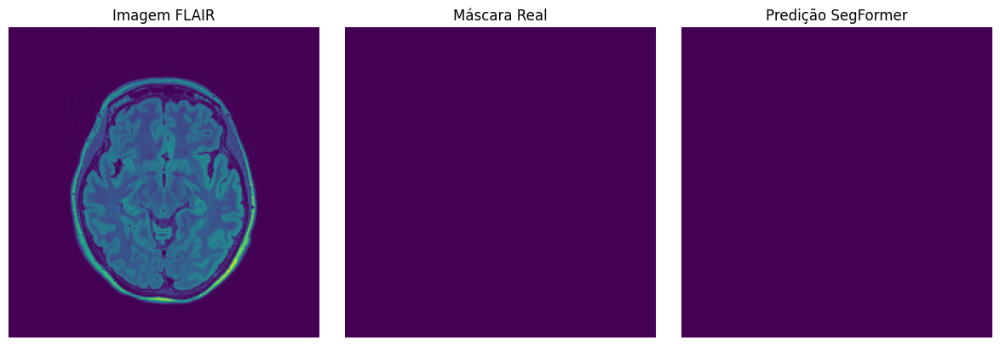

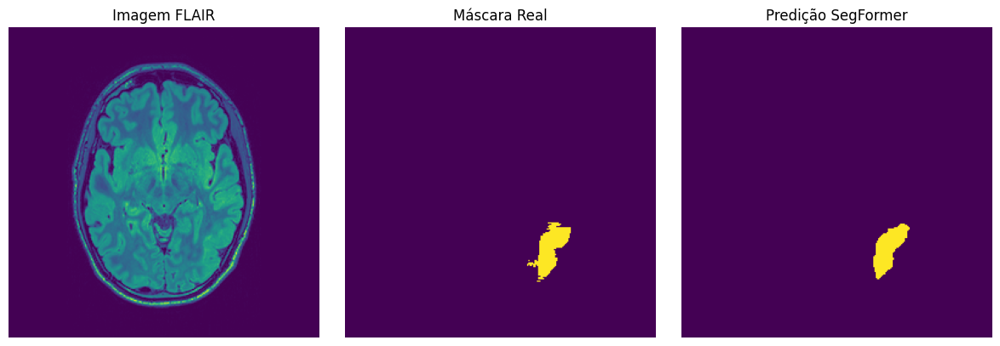

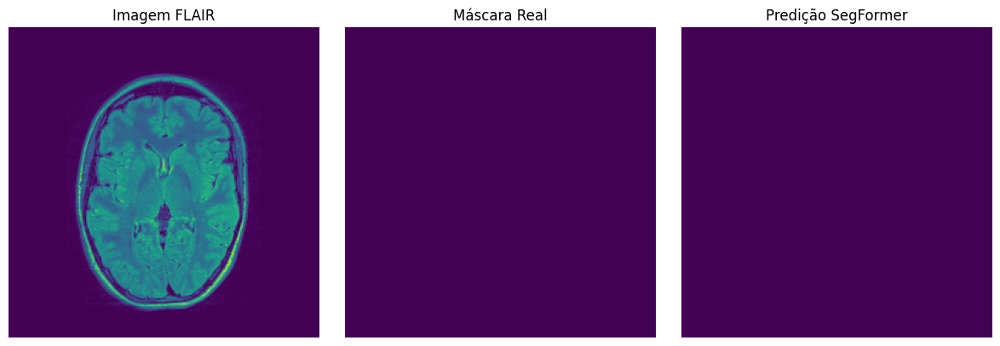

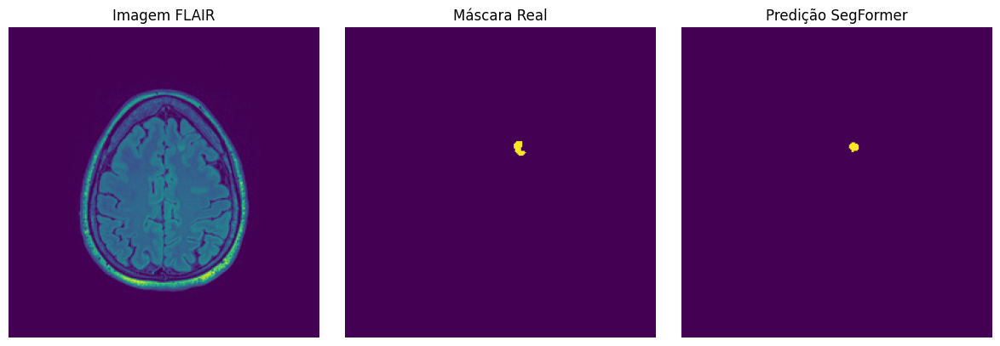

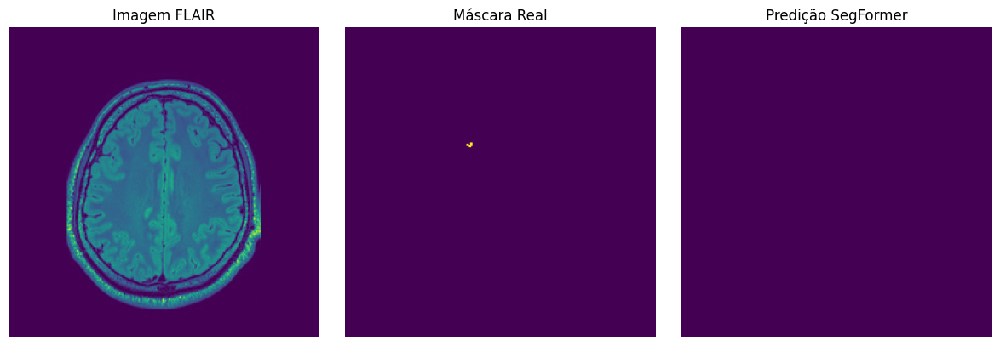

...

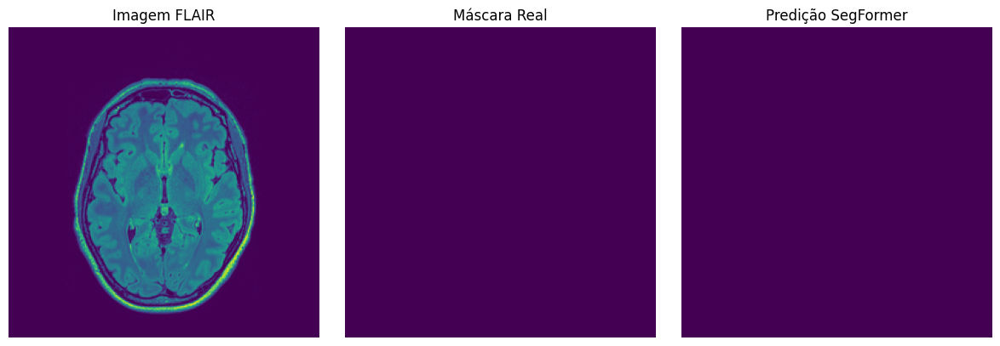

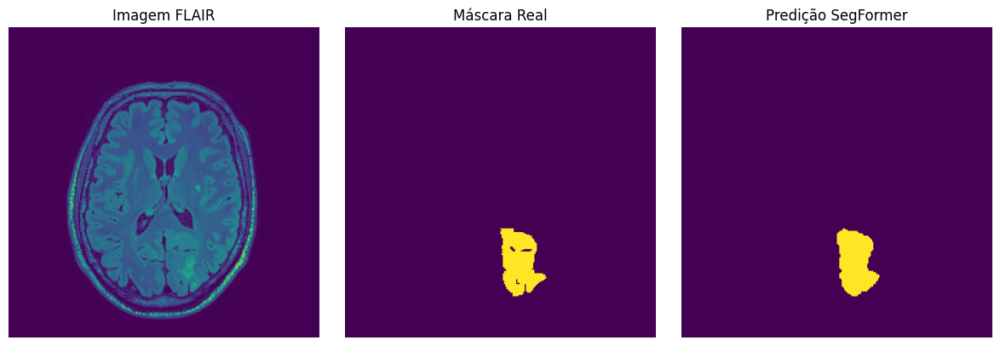

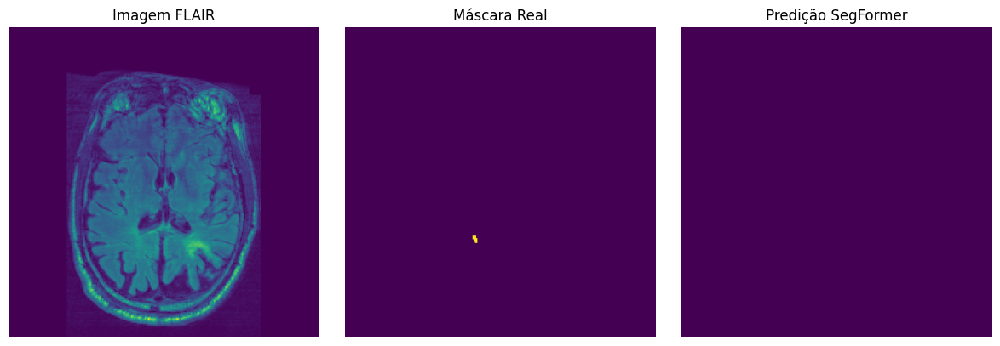

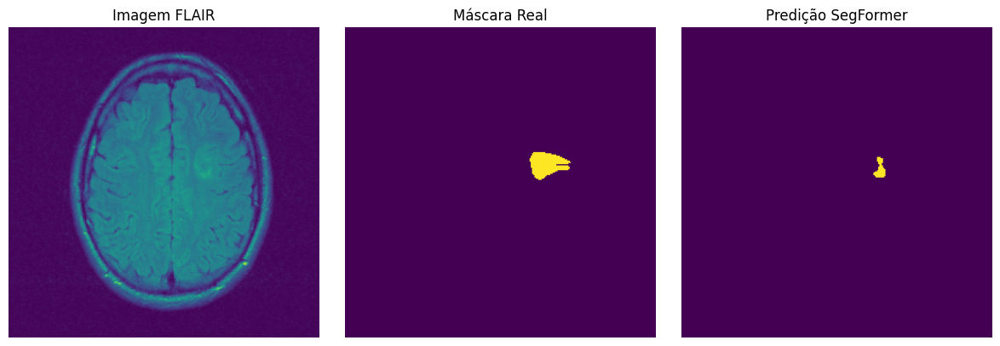

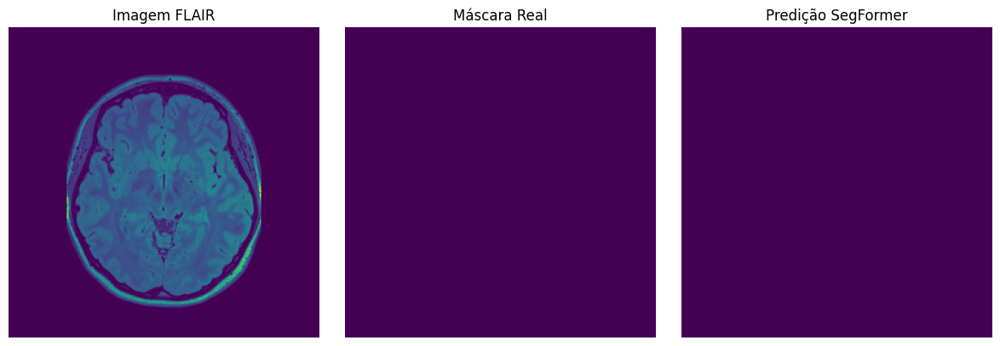

In [ ]:
# Visualização de 20 slices
fold_num = 1
base_path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold_num}/fold_outputs/fold{fold_num}"

# Carrega os arquivos
X_val = np.load(f"{base_path}/X_val.npy")
Y_val = np.load(f"{base_path}/Y_val.npy")
Y_pred = np.load(f"{base_path}/Y_pred.npy")

# Visualiza 20 slices
for i in range(20):
    plt.figure(figsize=(12, 4))

    # Imagem FLAIR (grayscale ou RGB)
    plt.subplot(1, 3, 1)
    plt.title("Imagem FLAIR")

    img = X_val[i]

    # Converte para escala de cinza se for RGB
    if img.ndim == 3 and img.shape[2] == 3:
        # converte RGB para cinza (usando ponderação padrão)
        img_gray = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
    else:
        img_gray = img.squeeze()

    plt.imshow(img_gray, cmap='viridis')
    plt.axis("off")

    # Máscara Real
    plt.subplot(1, 3, 2)
    plt.title("Máscara Real")
    plt.imshow(Y_val[i], cmap='viridis')
    plt.axis("off")

    # Máscara Predita
    plt.subplot(1, 3, 3)
    plt.title("Predição SegFormer")
    plt.imshow(Y_pred[i], cmap='viridis')
    plt.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
def calculate_all_metrics(y_true, y_pred):
      y_true_f = y_true.flatten()
      y_pred_f = y_pred.flatten()

      # Caso sem lesão e sem predição — acerto completo
      if np.sum(y_true_f) == 0 and np.sum(y_pred_f) == 0:
          cm = np.array([[np.prod(y_true.shape), 0], [0, 0]])  # matriz com só TN
          return cm, 1.0, 1.0, 1.0, 1.0, 1.0

      cm = confusion_matrix(y_true_f, y_pred_f, labels=[0, 1])
      precision = precision_score(y_true_f, y_pred_f, zero_division=0)
      recall = recall_score(y_true_f, y_pred_f, zero_division=0)
      f1 = f1_score(y_true_f, y_pred_f, zero_division=0)
      iou = jaccard_score(y_true_f, y_pred_f, zero_division=0)
      dice = dice_score_np(y_true, y_pred)
      return cm, dice, iou, recall, precision, f1


🔍 Análise qualitativa - SegFormer - Fold 1


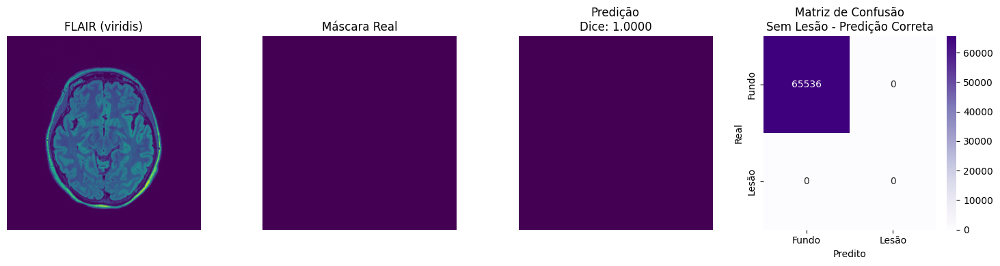

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


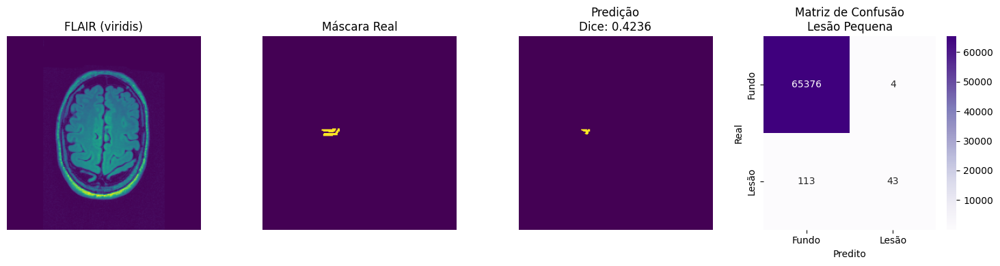

Dice: 0.4236, IoU: 0.2687, Recall: 0.2756, Precision: 0.9149, F1: 0.4236


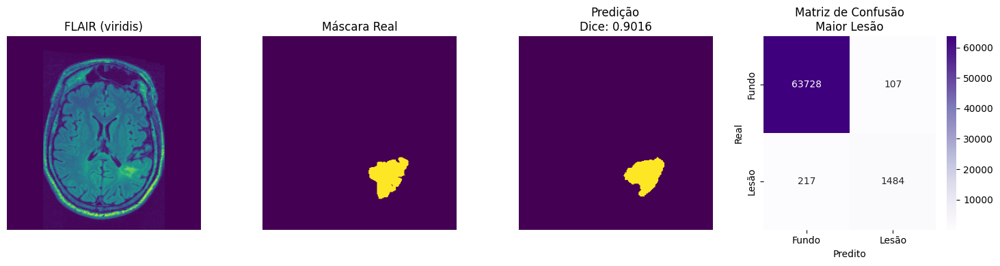

Dice: 0.9016, IoU: 0.8208, Recall: 0.8724, Precision: 0.9327, F1: 0.9016


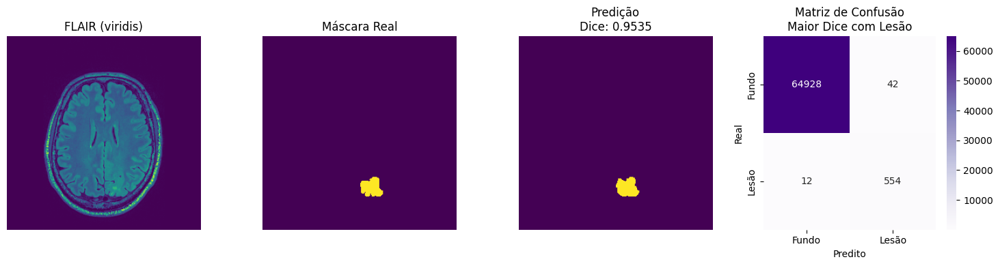

Dice: 0.9535, IoU: 0.9112, Recall: 0.9788, Precision: 0.9295, F1: 0.9535

🔍 Análise qualitativa - SegFormer - Fold 2


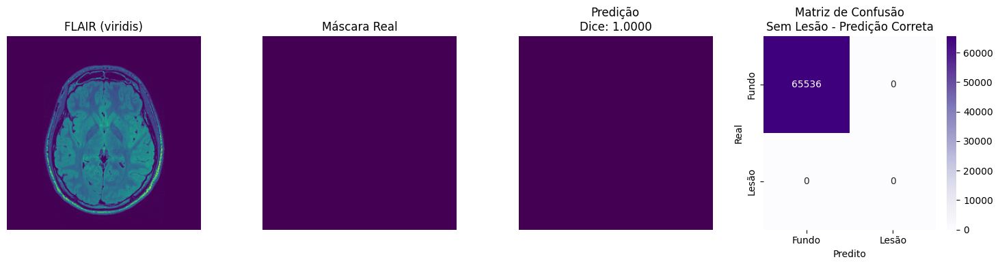

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


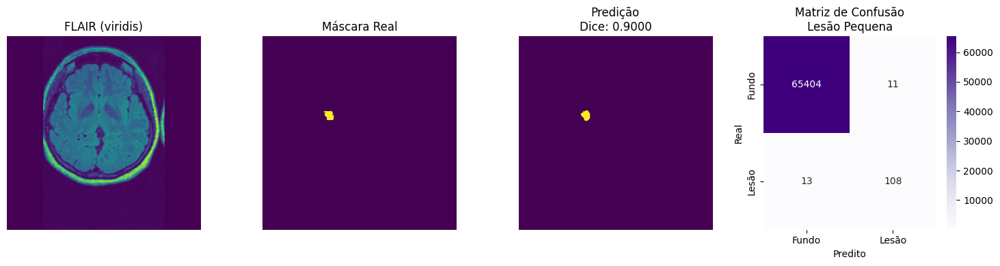

Dice: 0.9000, IoU: 0.8182, Recall: 0.8926, Precision: 0.9076, F1: 0.9000


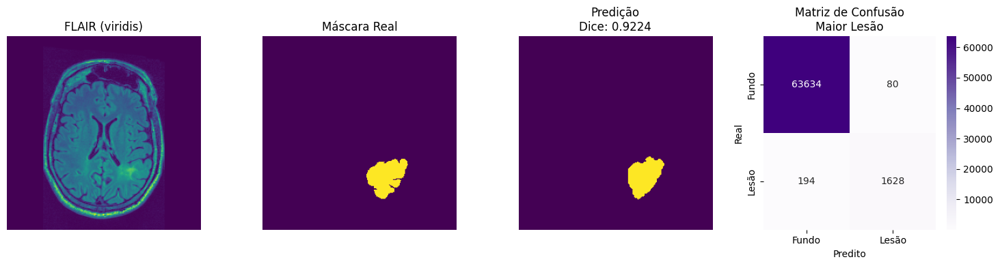

Dice: 0.9224, IoU: 0.8559, Recall: 0.8935, Precision: 0.9532, F1: 0.9224


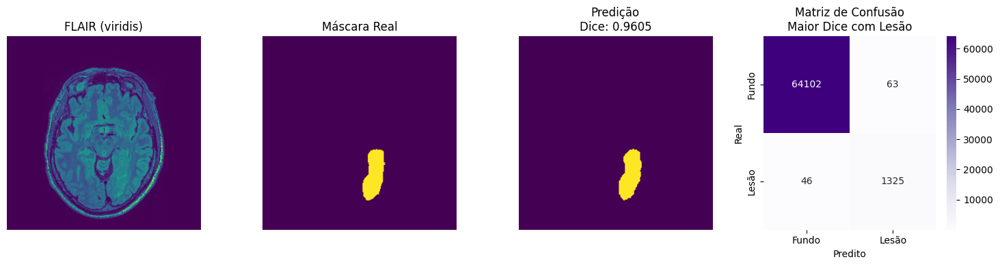

Dice: 0.9605, IoU: 0.9240, Recall: 0.9664, Precision: 0.9546, F1: 0.9605

🔍 Análise qualitativa - SegFormer - Fold 3


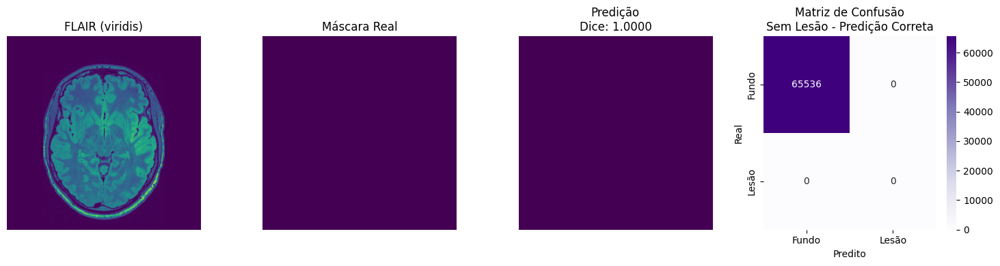

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


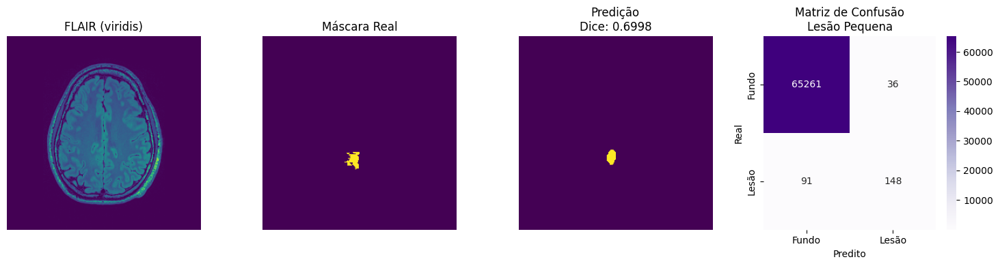

Dice: 0.6998, IoU: 0.5382, Recall: 0.6192, Precision: 0.8043, F1: 0.6998


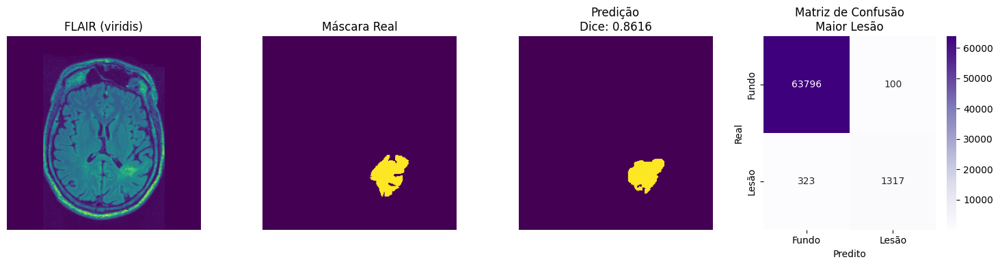

Dice: 0.8616, IoU: 0.7569, Recall: 0.8030, Precision: 0.9294, F1: 0.8616


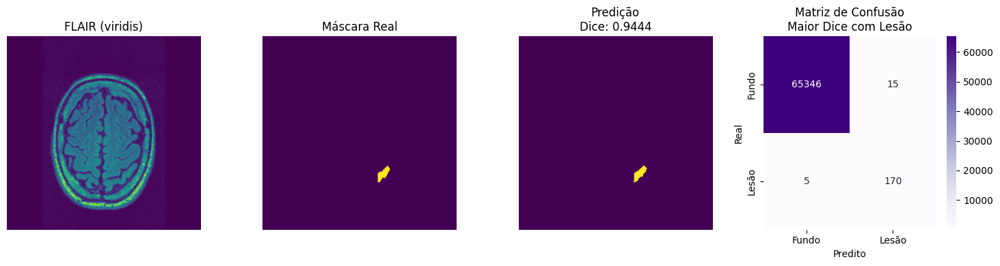

Dice: 0.9444, IoU: 0.8947, Recall: 0.9714, Precision: 0.9189, F1: 0.9444

🔍 Análise qualitativa - SegFormer - Fold 4


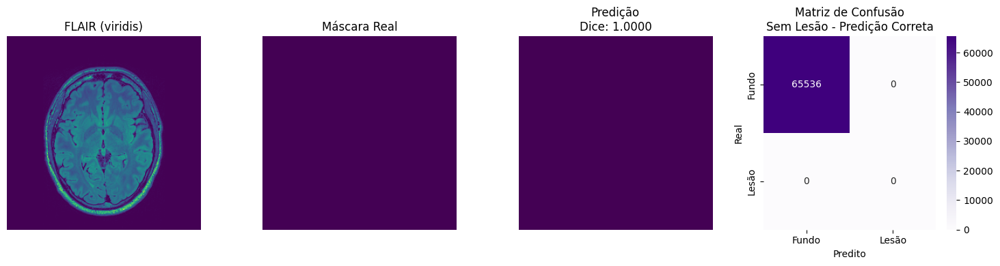

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


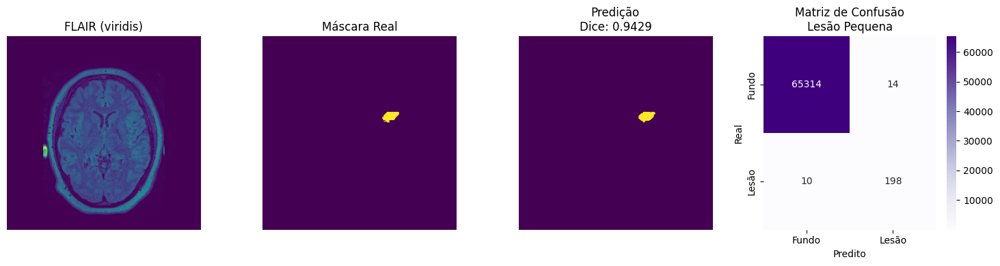

Dice: 0.9429, IoU: 0.8919, Recall: 0.9519, Precision: 0.9340, F1: 0.9429


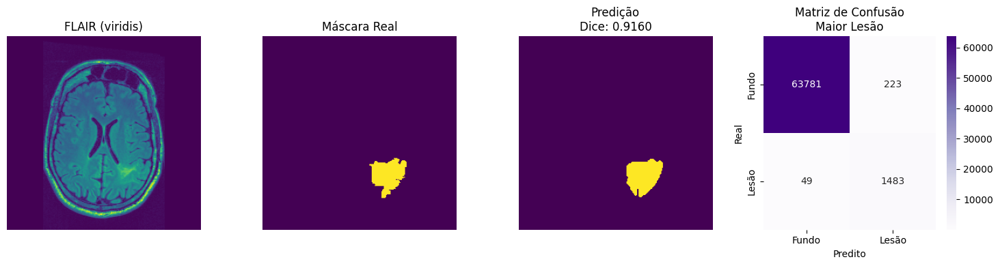

Dice: 0.9160, IoU: 0.8450, Recall: 0.9680, Precision: 0.8693, F1: 0.9160


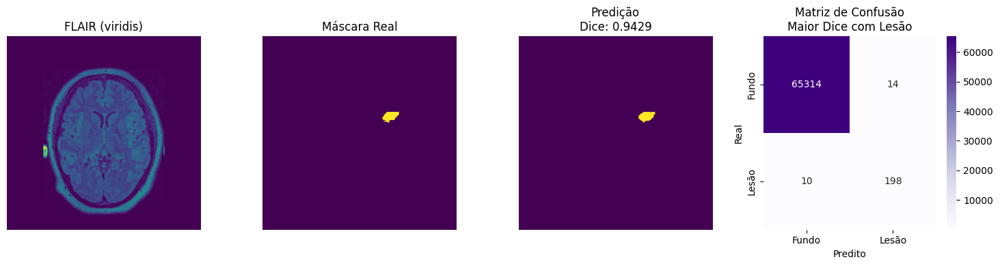

Dice: 0.9429, IoU: 0.8919, Recall: 0.9519, Precision: 0.9340, F1: 0.9429

🔍 Análise qualitativa - SegFormer - Fold 5


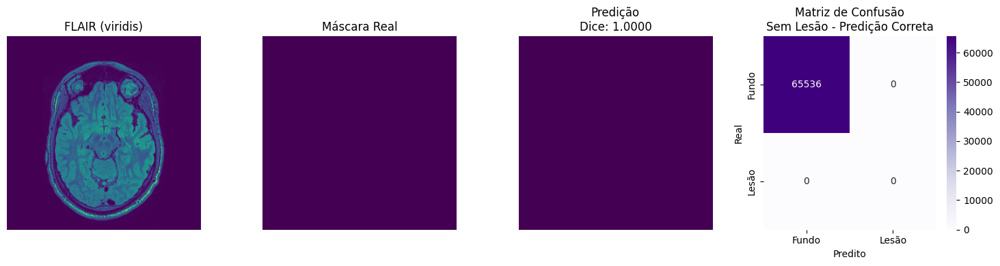

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


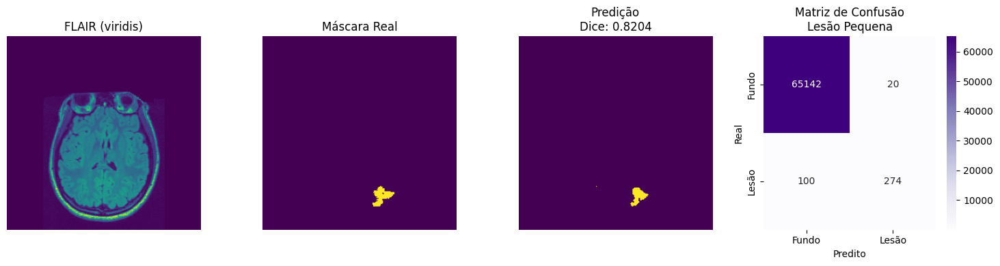

Dice: 0.8204, IoU: 0.6954, Recall: 0.7326, Precision: 0.9320, F1: 0.8204


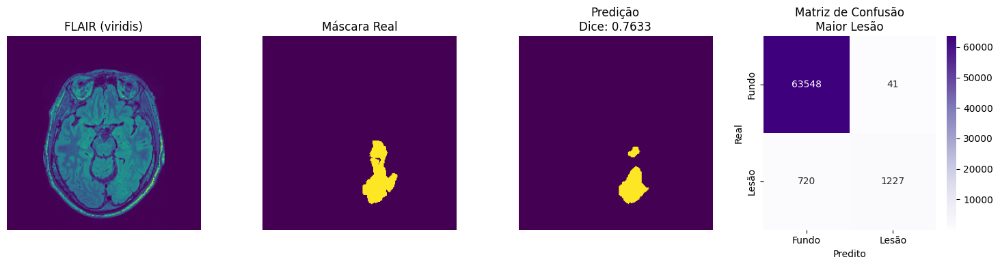

Dice: 0.7633, IoU: 0.6172, Recall: 0.6302, Precision: 0.9677, F1: 0.7633


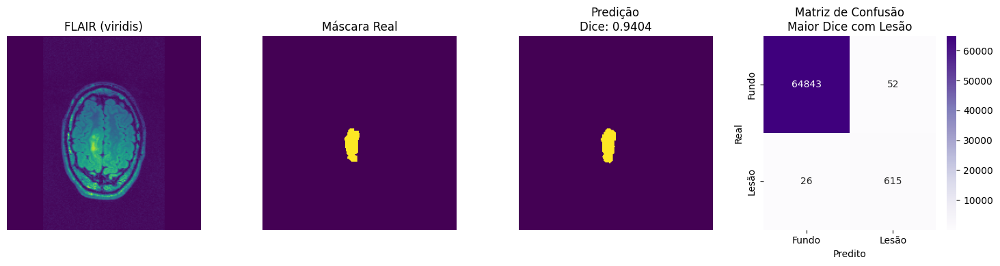

Dice: 0.9404, IoU: 0.8874, Recall: 0.9594, Precision: 0.9220, F1: 0.9404


In [ ]:
# Função de análise qualitativa para SegFormer
def analyze_saved_fold_segformer(fold_dir, fold_number):
    # Carrega os dados
    X_val = np.load(os.path.join(fold_dir, "X_val.npy"))
    Y_val = np.load(os.path.join(fold_dir, "Y_val.npy"))
    Y_pred = np.load(os.path.join(fold_dir, "Y_pred.npy"))

    print(f"\n🔍 Análise qualitativa - SegFormer - Fold {fold_number}")

    def plot_case(idx, title_extra=''):
        img = X_val[idx]
        if img.ndim == 3 and img.shape[2] == 3:
            # Converte RGB para escala de cinza para aplicar cmap
            flair = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
        else:
            flair = img.squeeze()

        mask_true = Y_val[idx].squeeze()
        pred_bin = Y_pred[idx].squeeze()

        cm, dice, iou, recall, precision, f1 = calculate_all_metrics(mask_true, pred_bin)

        plt.figure(figsize=(15, 4))
        plt.subplot(1, 4, 1)
        plt.title("FLAIR (viridis)")
        plt.imshow(flair, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 2)
        plt.title("Máscara Real")
        plt.imshow(mask_true, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 3)
        plt.title(f"Predição\nDice: {dice:.4f}")
        plt.imshow(pred_bin, cmap='viridis')
        plt.axis('off')

        plt.subplot(1, 4, 4)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
        plt.title(f"Matriz de Confusão\n{title_extra}")
        plt.xlabel("Predito")
        plt.ylabel("Real")

        plt.tight_layout()
        plt.show()

        print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

    # Calcula informações por slice
    lesion_pixels_per_slice = np.array([np.sum(mask > 0) for mask in Y_val])
    dice_per_slice = np.array([dice_score_np(Y_val[i], Y_pred[i]) for i in range(len(Y_val))])

    # Caso 1: Sem lesão e predição correta
    no_lesion_cases = np.where(lesion_pixels_per_slice == 0)[0]
    valid_no_lesion = [i for i in no_lesion_cases if np.sum(Y_pred[i]) == 0]
    if valid_no_lesion:
        plot_case(valid_no_lesion[0], title_extra="Sem Lesão - Predição Correta")

    # Caso 2: Lesão pequena
    lesion_small = np.where((lesion_pixels_per_slice > 100) & (lesion_pixels_per_slice < 400))[0]
    if len(lesion_small) > 0:
        plot_case(lesion_small[0], title_extra="Lesão Pequena")

    # Caso 3: Maior lesão
    plot_case(np.argmax(lesion_pixels_per_slice), title_extra="Maior Lesão")

    # Caso 4: Maior Dice entre casos com lesão
    cases_with_lesion = np.where(lesion_pixels_per_slice > 0)[0]
    if len(cases_with_lesion) > 0:
        idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice[cases_with_lesion])]
        plot_case(idx_best_dice, title_extra="Maior Dice com Lesão")

for i in range(1, 6):
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{i}/fold_outputs/fold{i}"
    analyze_saved_fold_segformer(fold_path, i)

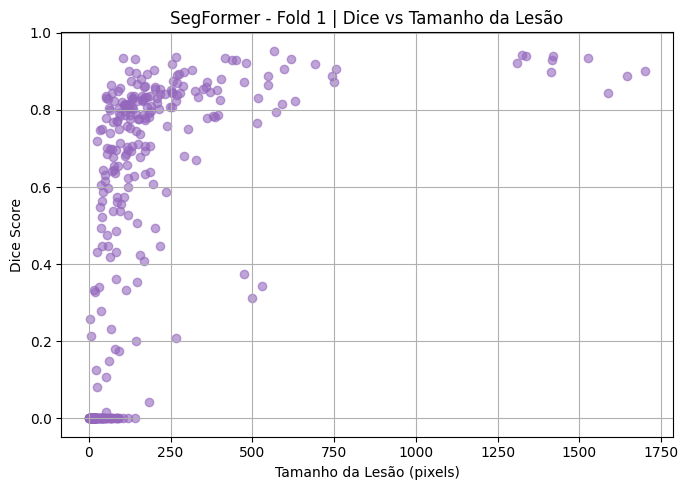

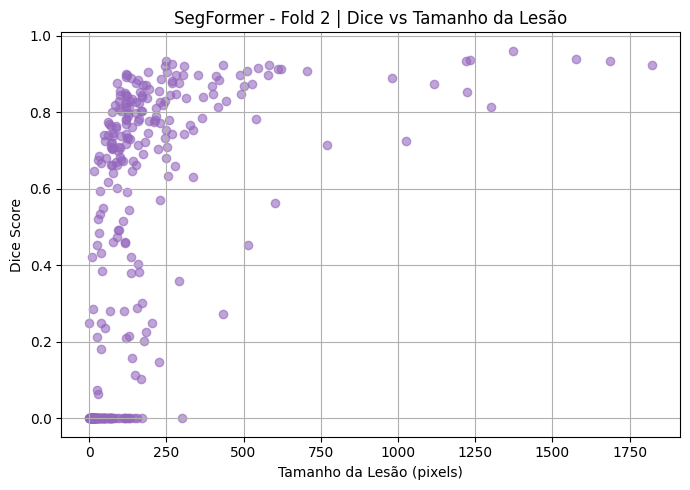

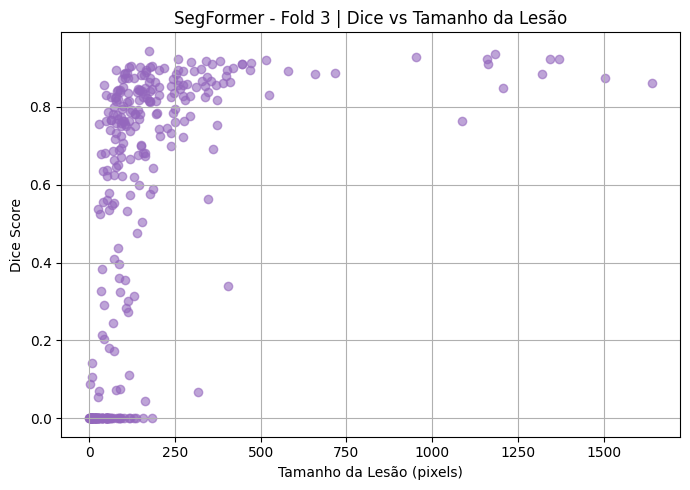

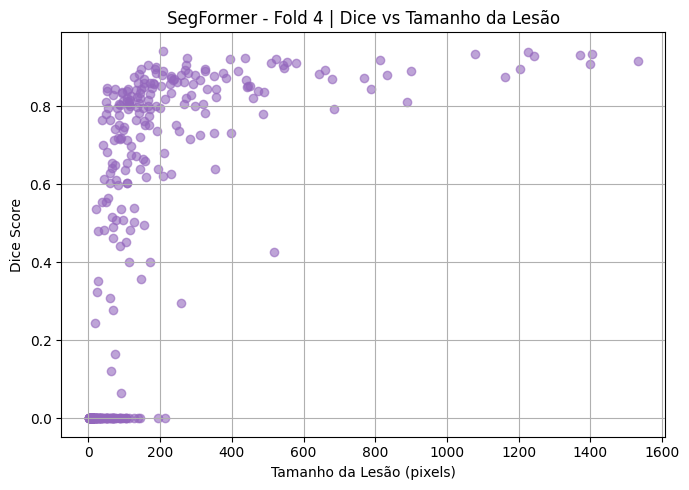

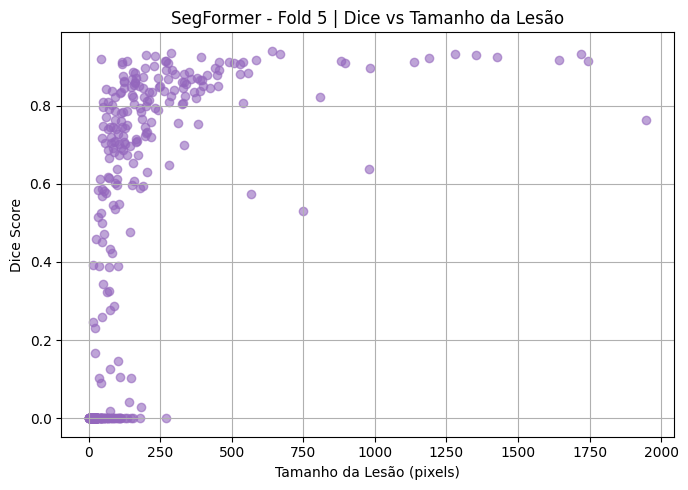

In [ ]:
# Plot Scatter
for fold in range(1, 6):
    path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold}/fold_outputs/fold{fold}"
    Y_val = np.load(f"{path}/Y_val.npy")
    Y_pred = np.load(f"{path}/Y_pred.npy")

    lesion_sizes = []
    dice_scores = []

    for i in range(len(Y_val)):
        true_mask = Y_val[i].squeeze()
        pred_mask = Y_pred[i].squeeze()
        lesion_size = np.sum(true_mask > 0)
        dice = dice_score_np(true_mask, pred_mask)
        if lesion_size > 0:
            lesion_sizes.append(lesion_size)
            dice_scores.append(dice)

    # Scatter plot por fold
    plt.figure(figsize=(7, 5))
    plt.scatter(lesion_sizes, dice_scores, alpha=0.6, color='tab:purple')
    plt.title(f"SegFormer - Fold {fold} | Dice vs Tamanho da Lesão")
    plt.xlabel("Tamanho da Lesão (pixels)")
    plt.ylabel("Dice Score")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Fold 1:


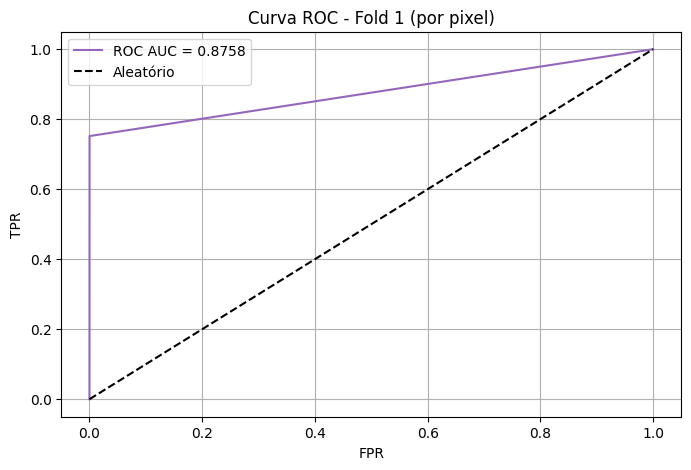

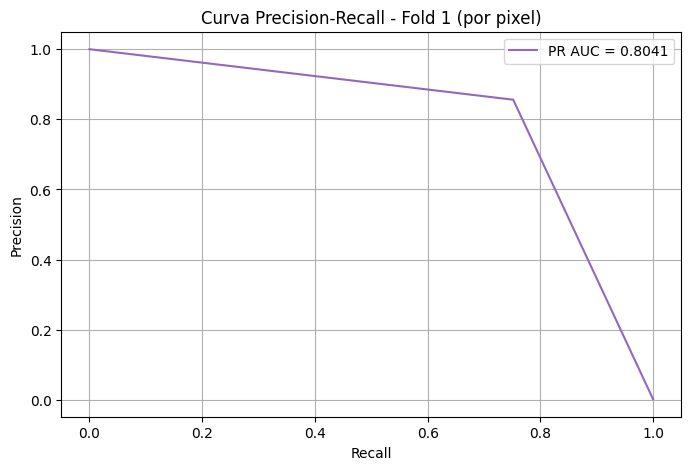

✔️ AUC ROC: 0.8758 | AUC PR: 0.8041

Fold 2:


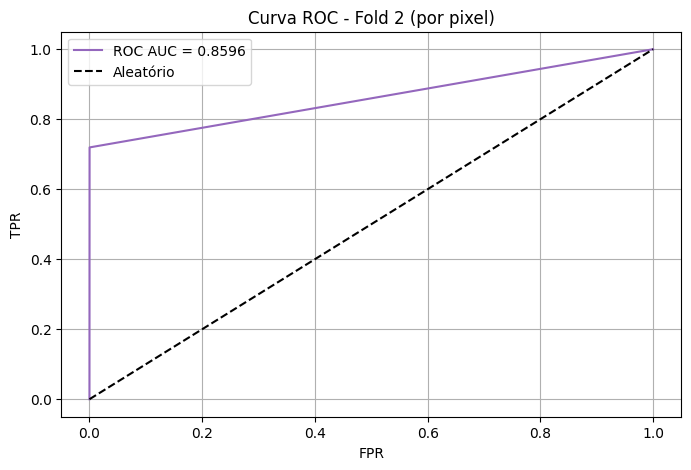

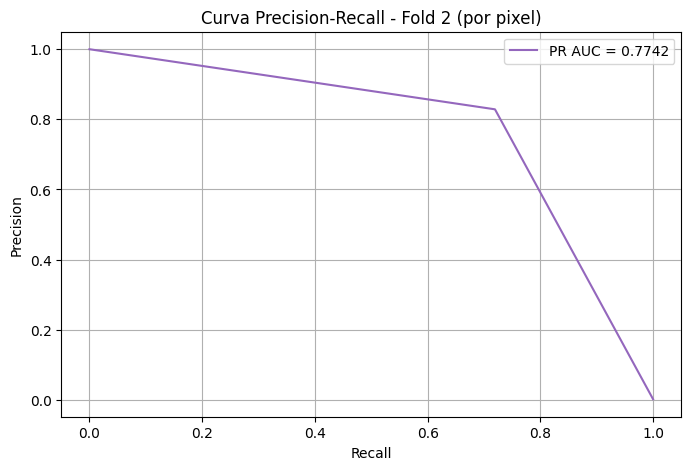

✔️ AUC ROC: 0.8596 | AUC PR: 0.7742

Fold 3:


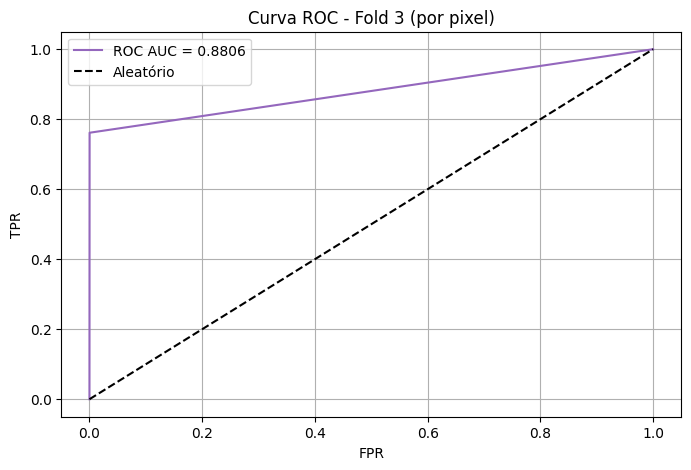

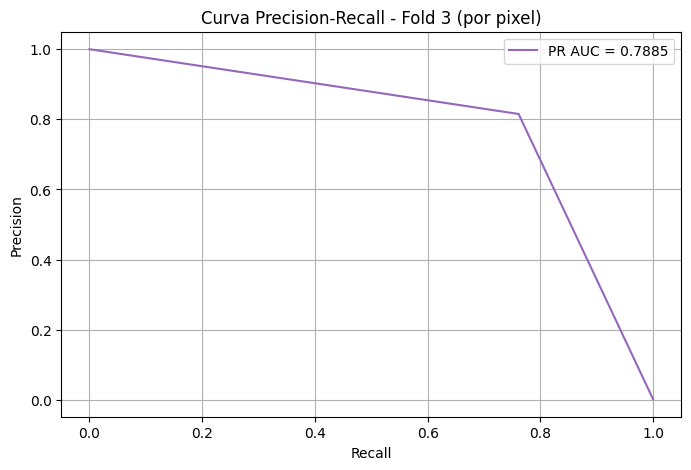

✔️ AUC ROC: 0.8806 | AUC PR: 0.7885

Fold 4:


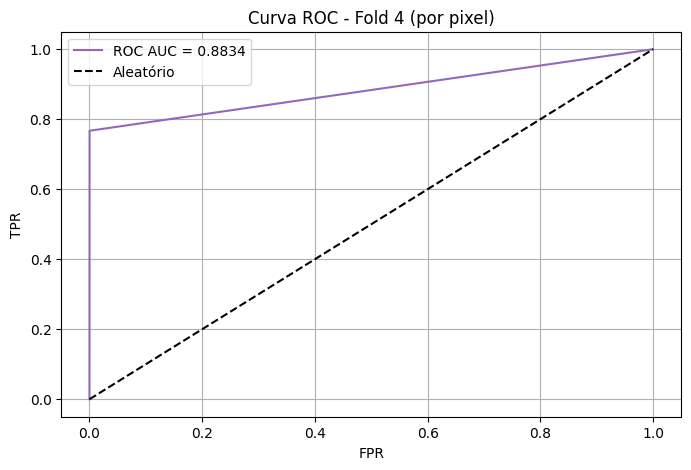

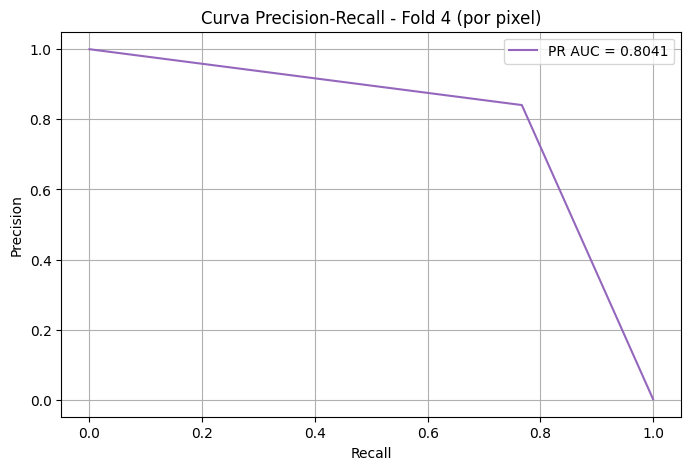

✔️ AUC ROC: 0.8834 | AUC PR: 0.8041

Fold 5:


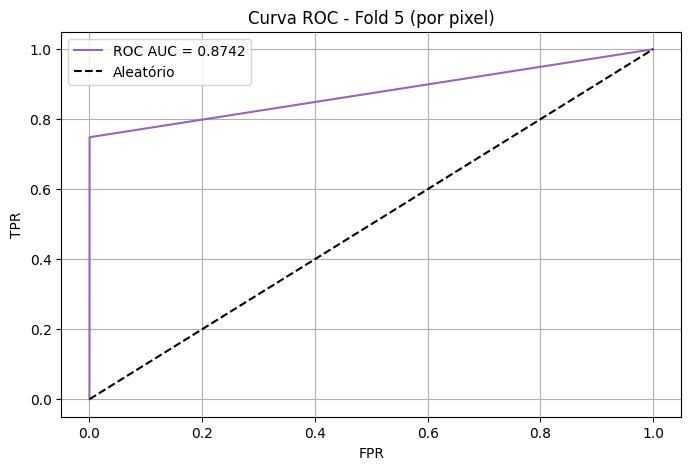

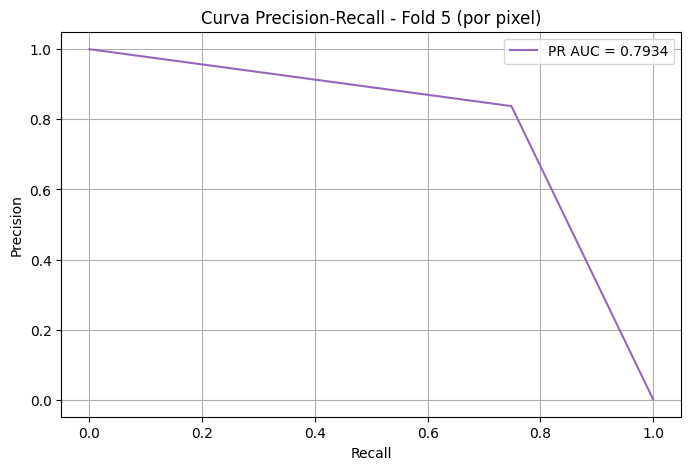

✔️ AUC ROC: 0.8742 | AUC PR: 0.7934


In [ ]:
# Curva ROC e Precision-Recall
for fold in range(1, 6):
    print(f"\nFold {fold}:")

    # Carrega os dados
    path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold}/fold_outputs/fold{fold}"
    Y_val = np.load(f"{path}/Y_val.npy").flatten()
    Y_probs = np.load(f"{path}/Y_pred.npy").flatten()

    # ROC Curve
    fpr, tpr, _ = roc_curve(Y_val, Y_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 5))
    plt.plot(fpr, tpr, label=f'ROC AUC = {roc_auc:.4f}', color='tab:purple')
    plt.plot([0, 1], [0, 1], 'k--', label='Aleatório')
    plt.title(f'Curva ROC - Fold {fold} (por pixel)')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.grid()
    plt.show()

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(Y_val, Y_probs)
    pr_auc = auc(recall, precision)

    plt.figure(figsize=(8, 5))
    plt.plot(recall, precision, label=f'PR AUC = {pr_auc:.4f}', color='tab:purple')
    plt.title(f'Curva Precision-Recall - Fold {fold} (por pixel)')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid()
    plt.show()

    print(f"✔️ AUC ROC: {roc_auc:.4f} | AUC PR: {pr_auc:.4f}")


🔍 SegFormer - Fold 1


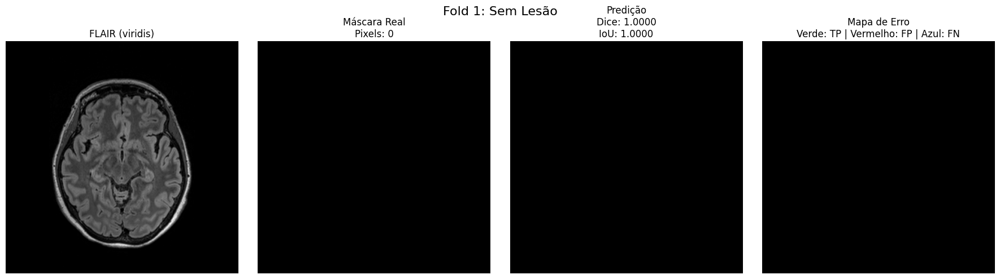

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


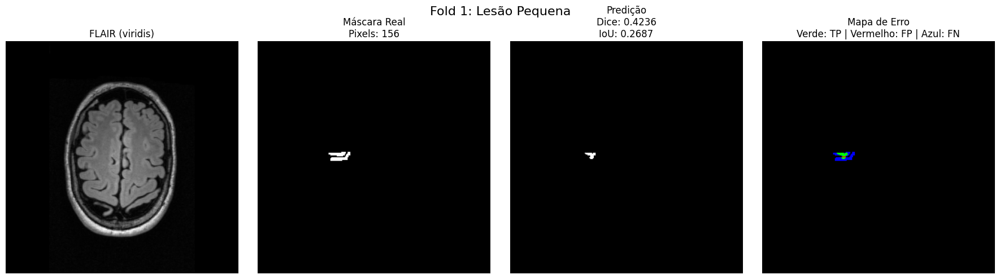

Dice: 0.4236, IoU: 0.2687, Recall: 0.2756, Precision: 0.9149, F1: 0.4236


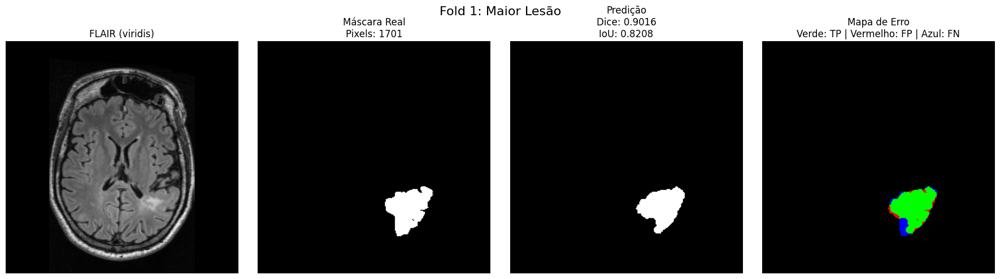

Dice: 0.9016, IoU: 0.8208, Recall: 0.8724, Precision: 0.9327, F1: 0.9016


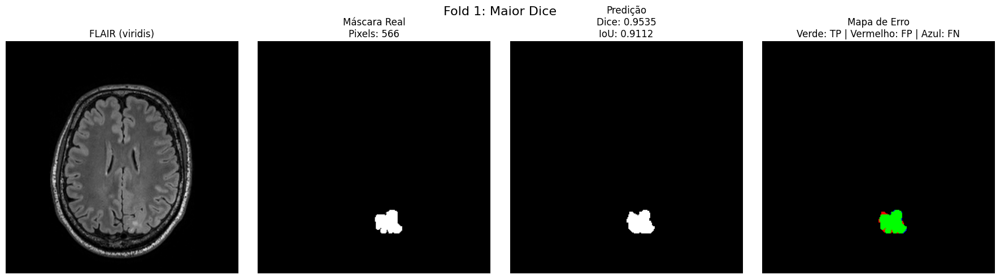

Dice: 0.9535, IoU: 0.9112, Recall: 0.9788, Precision: 0.9295, F1: 0.9535

🔍 SegFormer - Fold 2


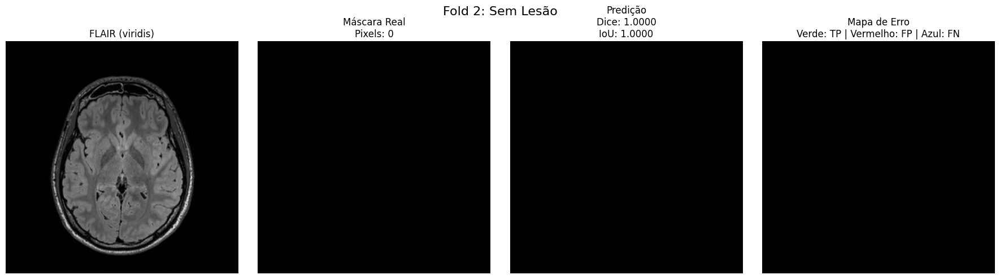

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


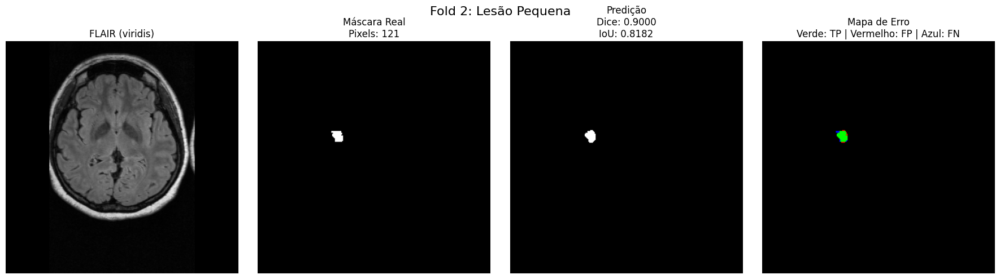

Dice: 0.9000, IoU: 0.8182, Recall: 0.8926, Precision: 0.9076, F1: 0.9000


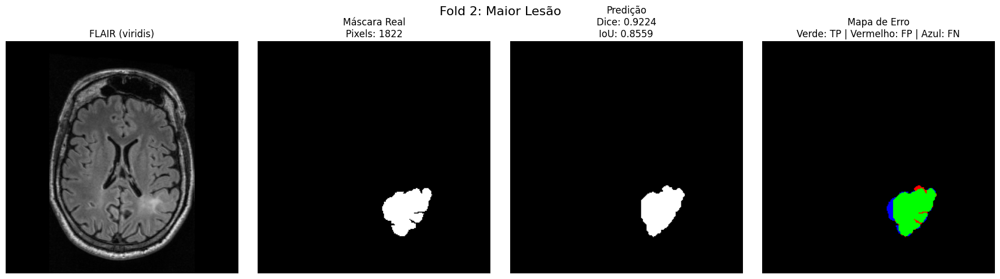

Dice: 0.9224, IoU: 0.8559, Recall: 0.8935, Precision: 0.9532, F1: 0.9224


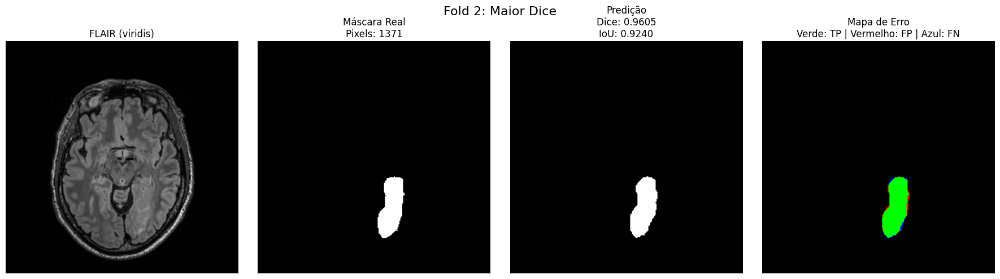

Dice: 0.9605, IoU: 0.9240, Recall: 0.9664, Precision: 0.9546, F1: 0.9605

🔍 SegFormer - Fold 3


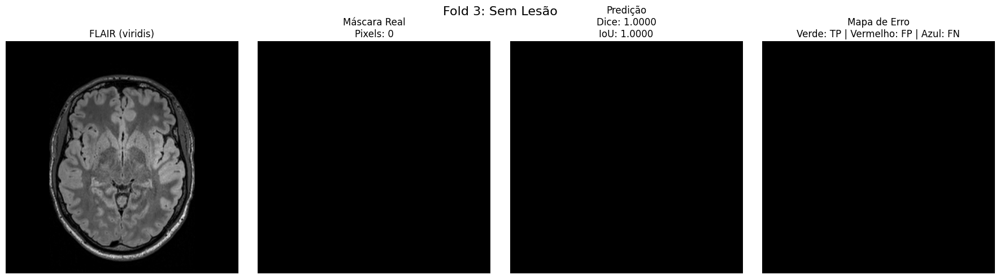

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


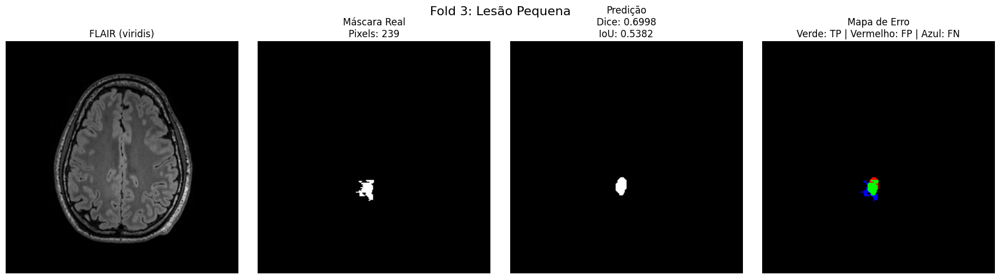

Dice: 0.6998, IoU: 0.5382, Recall: 0.6192, Precision: 0.8043, F1: 0.6998


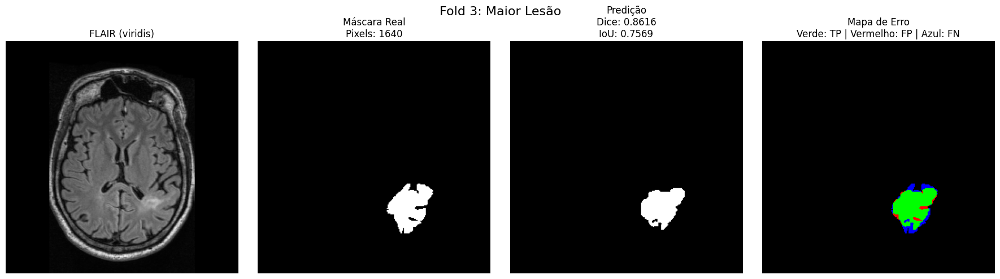

Dice: 0.8616, IoU: 0.7569, Recall: 0.8030, Precision: 0.9294, F1: 0.8616


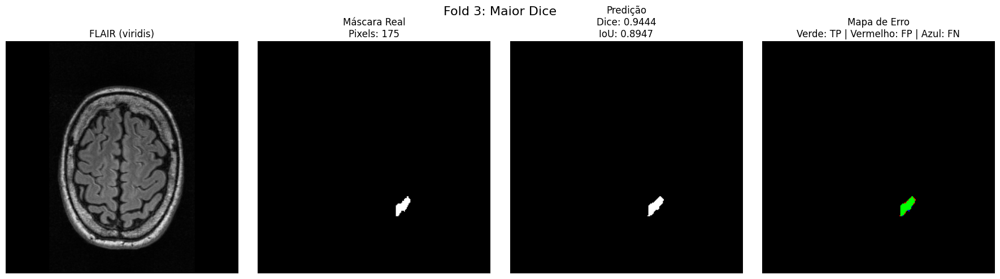

Dice: 0.9444, IoU: 0.8947, Recall: 0.9714, Precision: 0.9189, F1: 0.9444

🔍 SegFormer - Fold 4


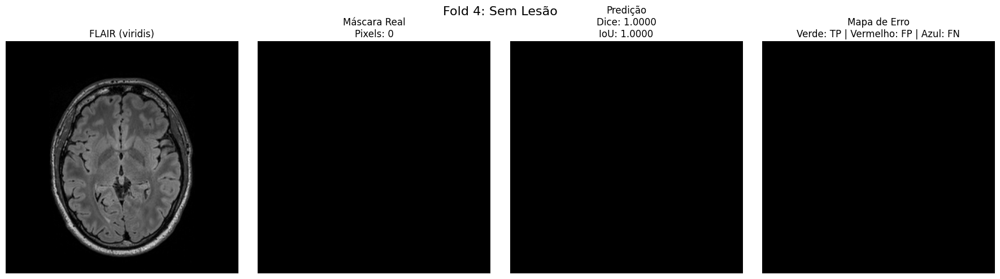

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


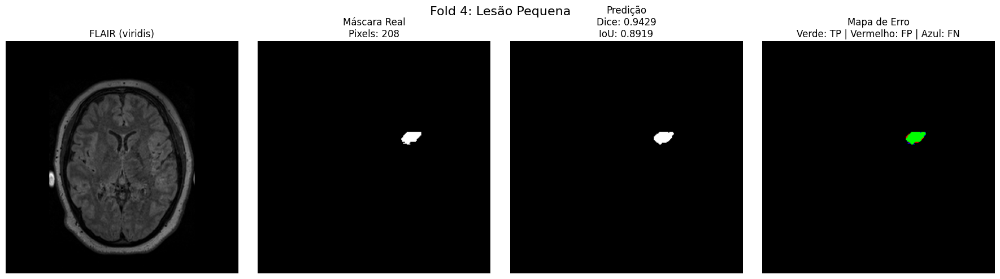

Dice: 0.9429, IoU: 0.8919, Recall: 0.9519, Precision: 0.9340, F1: 0.9429


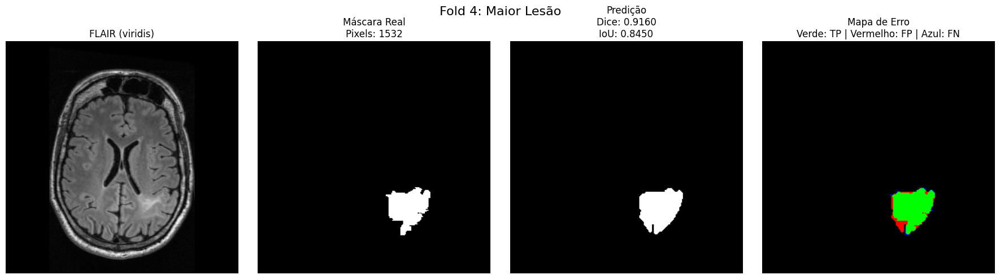

Dice: 0.9160, IoU: 0.8450, Recall: 0.9680, Precision: 0.8693, F1: 0.9160


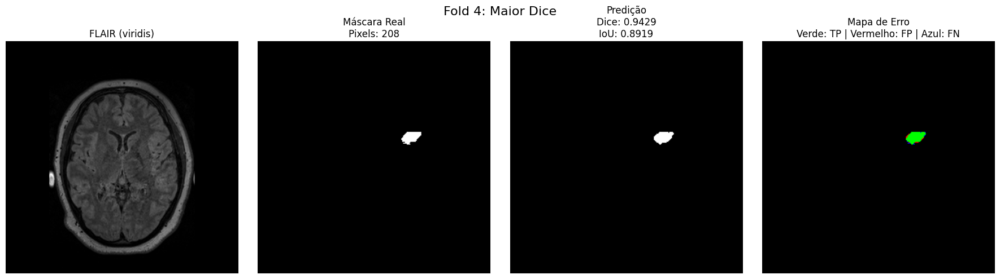

Dice: 0.9429, IoU: 0.8919, Recall: 0.9519, Precision: 0.9340, F1: 0.9429

🔍 SegFormer - Fold 5


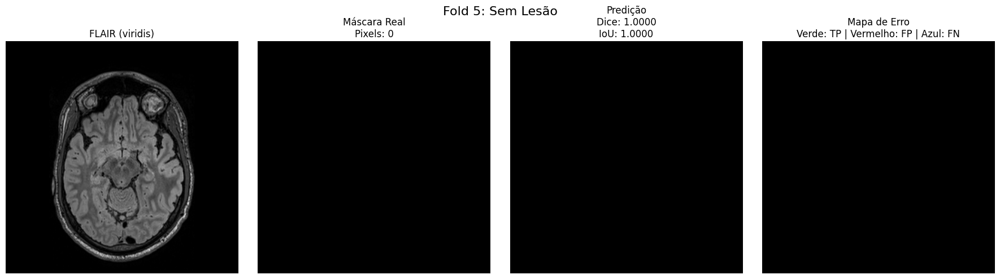

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


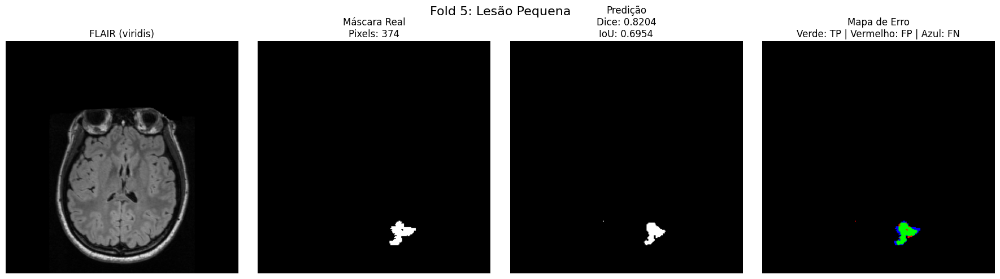

Dice: 0.8204, IoU: 0.6954, Recall: 0.7326, Precision: 0.9320, F1: 0.8204


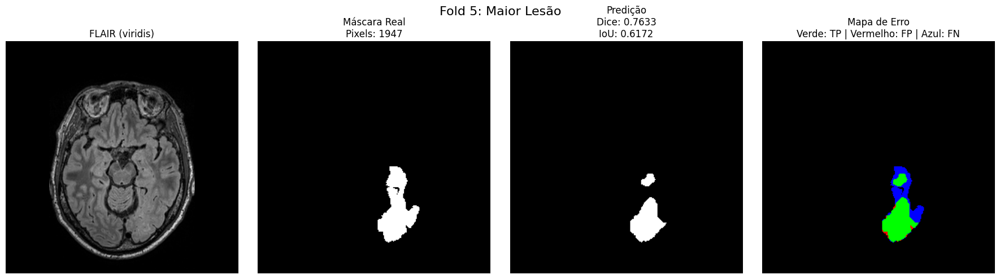

Dice: 0.7633, IoU: 0.6172, Recall: 0.6302, Precision: 0.9677, F1: 0.7633


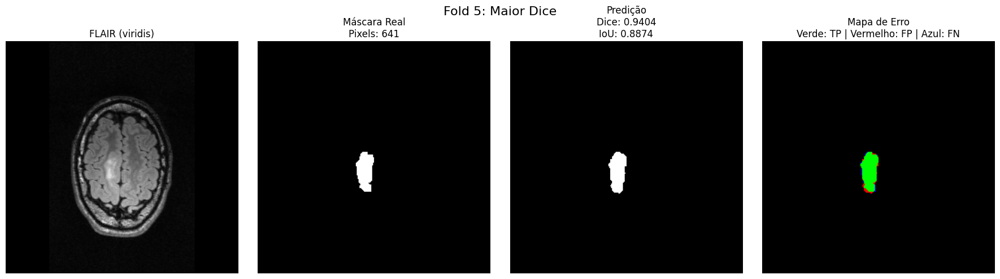

Dice: 0.9404, IoU: 0.8874, Recall: 0.9594, Precision: 0.9220, F1: 0.9404


In [ ]:
# Plot qualitativo com mapa de erro
def plot_case_qualitativo_segformer(x, y_true, y_pred_bin, idx, title_extra=''):
    img = x[idx]
    mask_true = y_true[idx].squeeze()
    pred_bin = y_pred_bin[idx].squeeze()

    # Converte para escala de cinza se for RGB
    if img.ndim == 3 and img.shape[2] == 3:
        flair = np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])
    else:
        flair = img.squeeze()

    # Métricas
    cm, dice, iou, recall, precision, f1 = calculate_all_metrics(mask_true, pred_bin)

    # Mapa de erro colorido
    intersection = np.logical_and(mask_true == 1, pred_bin == 1)
    false_positive = np.logical_and(mask_true == 0, pred_bin == 1)
    false_negative = np.logical_and(mask_true == 1, pred_bin == 0)
    error_map = np.zeros((*mask_true.shape, 3), dtype=np.uint8)
    error_map[intersection] = [0, 255, 0]      # Verde = acerto
    error_map[false_positive] = [255, 0, 0]    # Vermelho = falso positivo
    error_map[false_negative] = [0, 0, 255]    # Azul = falso negativo

    # Plots
    plt.figure(figsize=(18, 5))
    plt.subplot(1, 4, 1)
    plt.title("FLAIR (viridis)")
    plt.imshow(flair, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Máscara Real\nPixels: {np.sum(mask_true)}")
    plt.imshow(mask_true, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}\nIoU: {iou:.4f}")
    plt.imshow(pred_bin, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Mapa de Erro\nVerde: TP | Vermelho: FP | Azul: FN")
    plt.imshow(error_map)
    plt.axis('off')

    plt.suptitle(title_extra, fontsize=16)
    plt.tight_layout()
    plt.show()

    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Loop por fold
for fold in range(1, 6):
    print(f"\n🔍 SegFormer - Fold {fold}")

    path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold}/fold_outputs/fold{fold}"
    X_val = np.load(os.path.join(path, "X_val.npy"))
    Y_val = np.load(os.path.join(path, "Y_val.npy"))
    Y_pred = np.load(os.path.join(path, "Y_pred.npy"))

    lesion_pixels = np.array([np.sum(y) for y in Y_val])
    dice_scores = np.array([
        dice_score_np(Y_val[i].squeeze(), Y_pred[i].squeeze())
        for i in range(len(Y_val))
    ])

    # Caso 1 – Sem lesão e fundo predito corretamente
    no_lesion = np.where(lesion_pixels == 0)[0]
    correct_bg = [i for i in no_lesion if np.sum(Y_pred[i]) == 0]
    if correct_bg:
        plot_case_qualitativo_segformer(X_val, Y_val, Y_pred, correct_bg[0], title_extra=f'Fold {fold}: Sem Lesão')

    # Caso 2 – Lesão pequena
    small_lesion = np.where((lesion_pixels > 100) & (lesion_pixels < 400))[0]
    if len(small_lesion) > 0:
        plot_case_qualitativo_segformer(X_val, Y_val, Y_pred, small_lesion[0], title_extra=f'Fold {fold}: Lesão Pequena')

    # Caso 3 – Maior lesão
    largest_idx = np.argmax(lesion_pixels)
    plot_case_qualitativo_segformer(X_val, Y_val, Y_pred, largest_idx, title_extra=f'Fold {fold}: Maior Lesão')

    # Caso 4 – Melhor Dice em slice com lesão
    with_lesion = np.where(lesion_pixels > 0)[0]
    if len(with_lesion) > 0:
        best_dice_idx = with_lesion[np.argmax(dice_scores[with_lesion])]
        plot_case_qualitativo_segformer(X_val, Y_val, Y_pred, best_dice_idx, title_extra=f'Fold {fold}: Maior Dice')


🔍 SegFormer - Fold 1


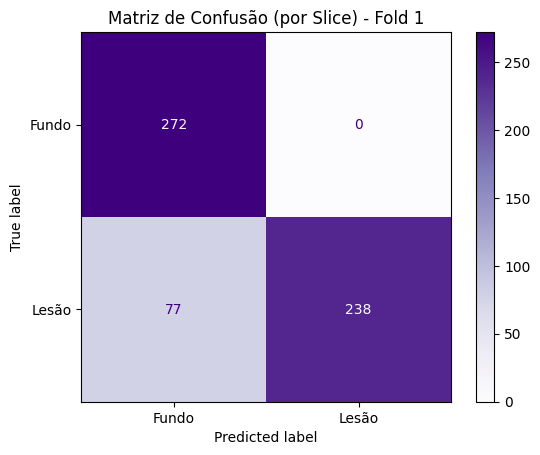


🔍 SegFormer - Fold 2


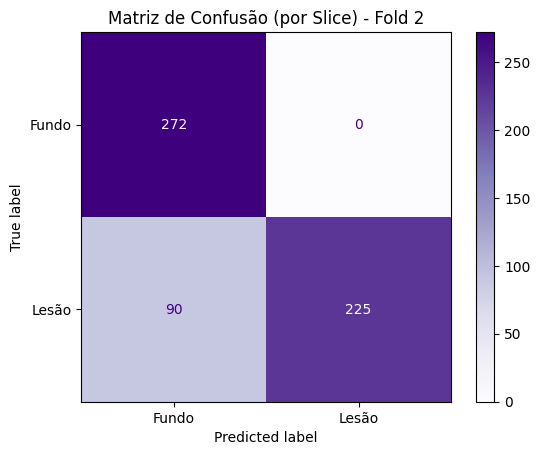


🔍 SegFormer - Fold 3


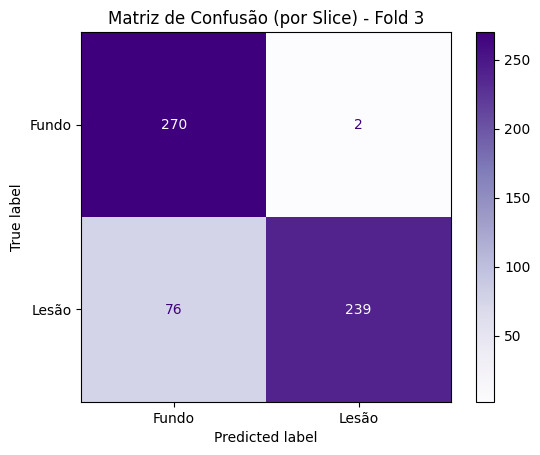


🔍 SegFormer - Fold 4


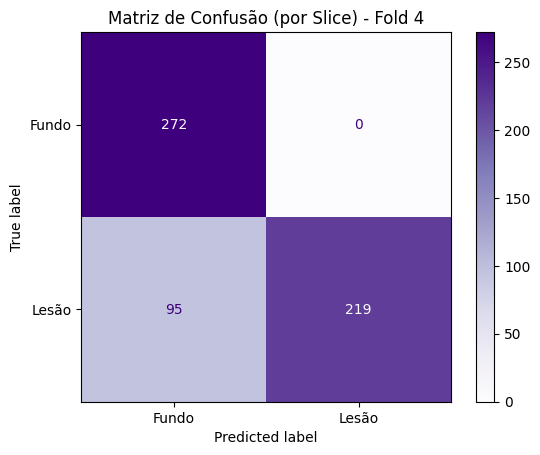


🔍 SegFormer - Fold 5


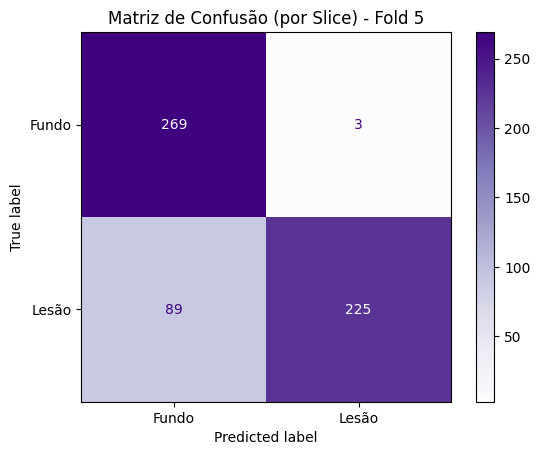

In [ ]:
# Matriz de confusão (por slice)
threshold = 0.6

for fold in range(1, 6):
    print(f"\n🔍 SegFormer - Fold {fold}")
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold}/fold_outputs/fold{fold}"

    Y_val = np.load(f"{fold_path}/Y_val.npy")
    Y_pred = np.load(f"{fold_path}/Y_pred.npy")

    y_true_slice = []
    y_pred_slice = []

    for i in range(len(Y_val)):
        mask_true = Y_val[i].squeeze()
        mask_pred = Y_pred[i].squeeze()

        has_lesion_gt = int(np.sum(mask_true) > 0)
        has_lesion_pred = int(np.sum(mask_pred) > 0)

        y_true_slice.append(has_lesion_gt)
        y_pred_slice.append(has_lesion_pred)

    # Matriz de Confusão (presença de lesão por slice)
    cm_slice = confusion_matrix(y_true_slice, y_pred_slice, labels=[0, 1])

    disp = ConfusionMatrixDisplay(confusion_matrix=cm_slice, display_labels=["Fundo", "Lesão"])
    disp.plot(cmap='Purples', values_format='d')
    plt.title(f"Matriz de Confusão (por Slice) - Fold {fold}")
    plt.grid(False)
    plt.show()


🔍 SegFormer - Fold 1


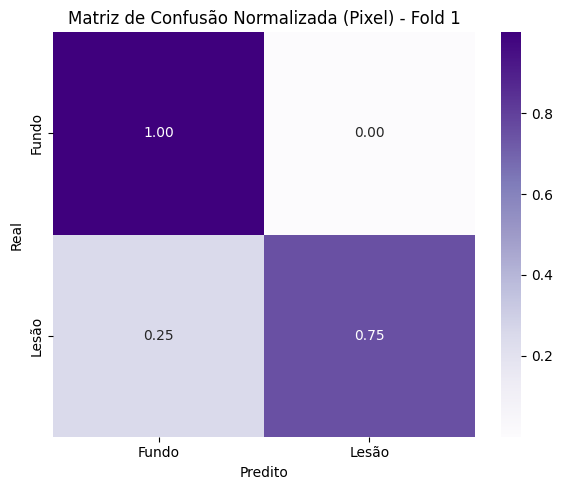


🔍 SegFormer - Fold 2


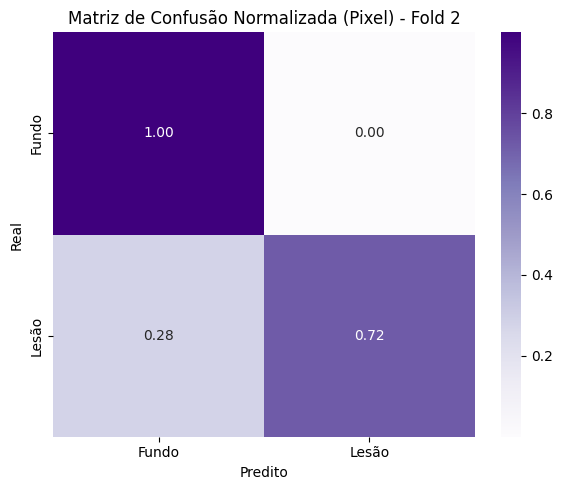


🔍 SegFormer - Fold 3


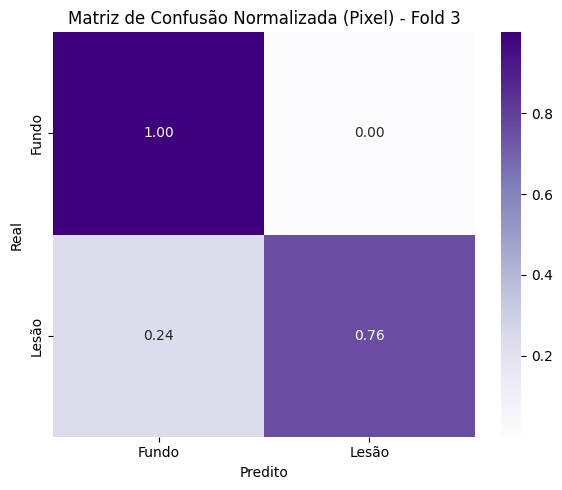


🔍 SegFormer - Fold 4


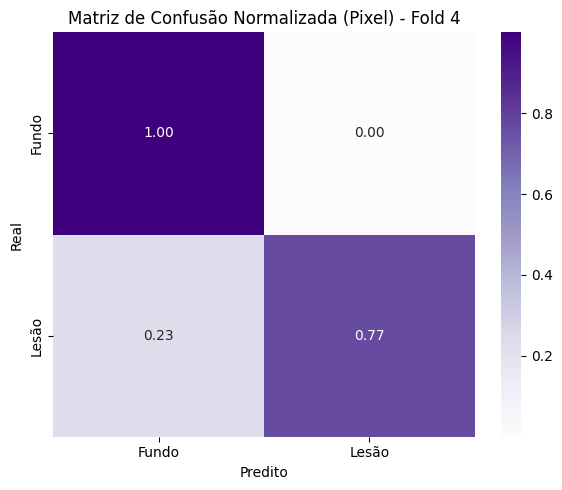


🔍 SegFormer - Fold 5


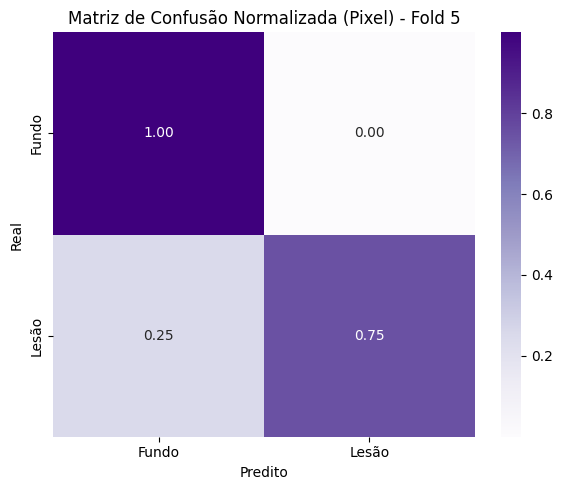

In [ ]:
# Matriz de confusão normalizada
threshold = 0.6
use_probs = False

for fold in range(1, 6):
    print(f"\n🔍 SegFormer - Fold {fold}")
    fold_path = f"/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_fold{fold}/fold_outputs/fold{fold}"

    # Carrega
    Y_val = np.load(f"{fold_path}/Y_val.npy")

    if use_probs:
        Y_raw = np.load(f"{fold_path}/Y_probs.npy")  # contínuo
        Y_pred_bin = (Y_raw > threshold).astype(np.uint8)
    else:
        Y_pred_bin = np.load(f"{fold_path}/Y_pred.npy")  # já binário

    # Flatten de todas as slices
    all_y_true = Y_val.flatten()
    all_y_pred = Y_pred_bin.flatten()

    # Matriz de confusão
    cm_pixel = confusion_matrix(all_y_true, all_y_pred, labels=[0, 1])

    # Normaliza por linha
    cm_norm = cm_pixel.astype('float') / cm_pixel.sum(axis=1, keepdims=True)

    # Plot
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm_norm, annot=True, cmap='Purples', fmt='.2f',
                xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])
    plt.title(f"Matriz de Confusão Normalizada (Pixel) - Fold {fold}" + (f" | Threshold {threshold}" if use_probs else ""))
    plt.xlabel("Predito")
    plt.ylabel("Real")
    plt.tight_layout()
    plt.show()

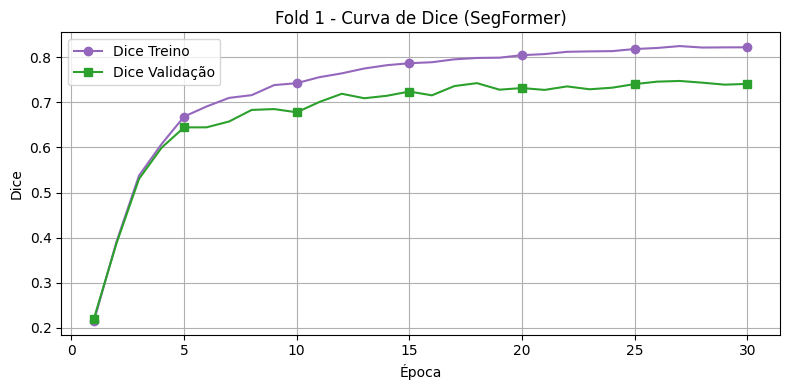

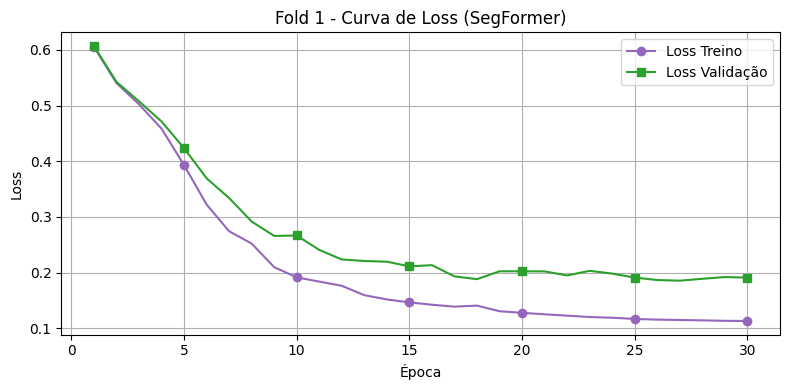

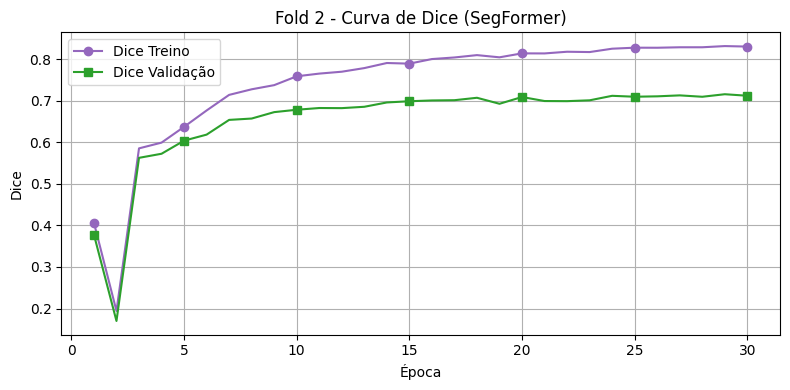

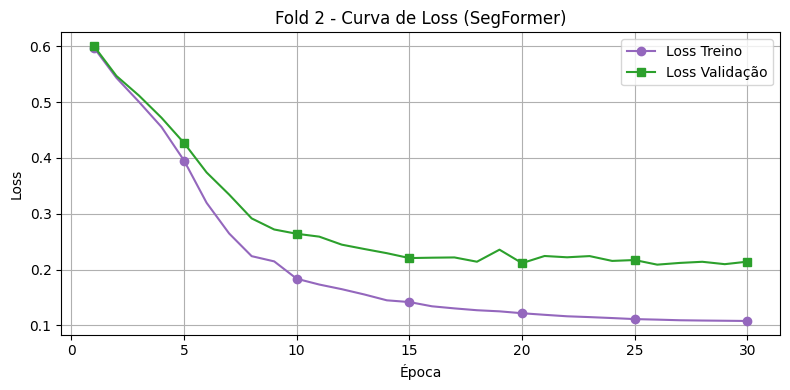

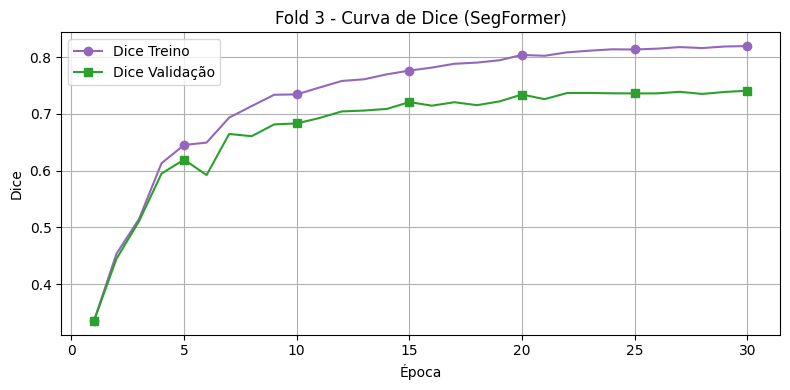

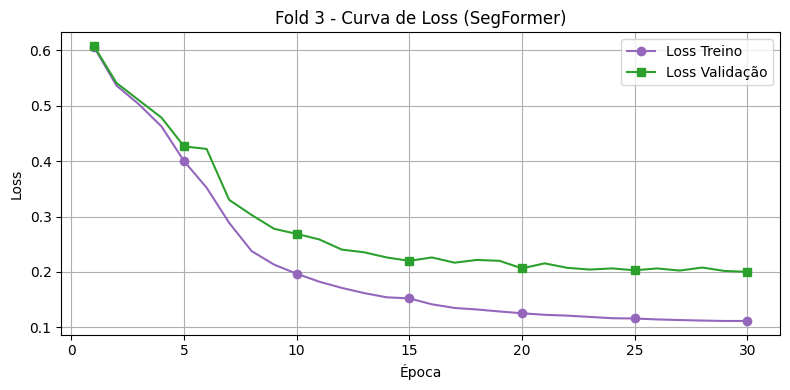

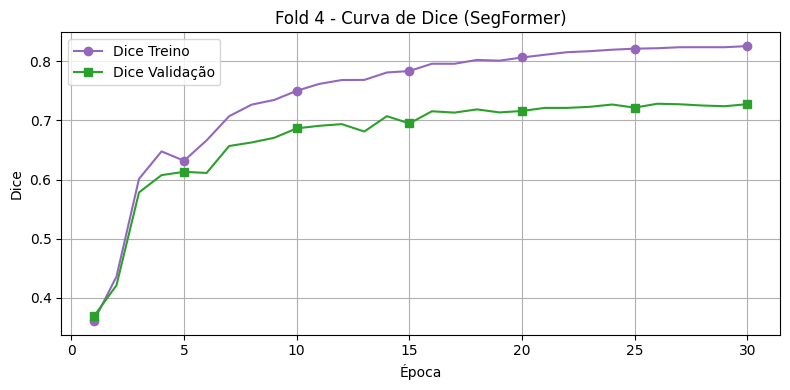

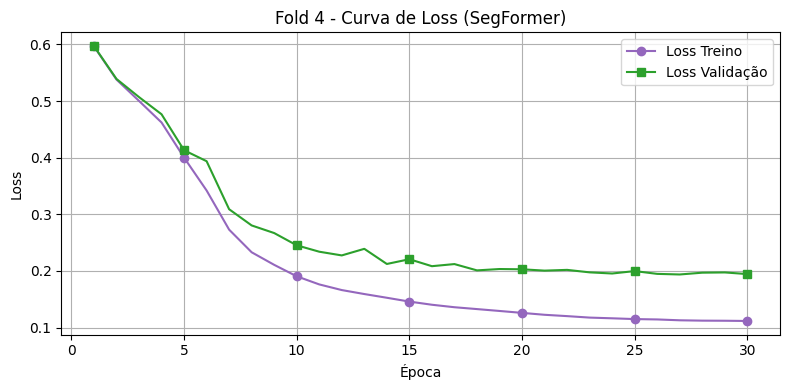

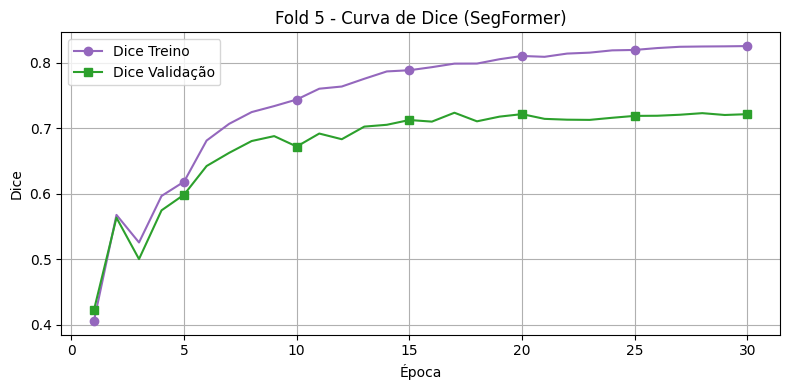

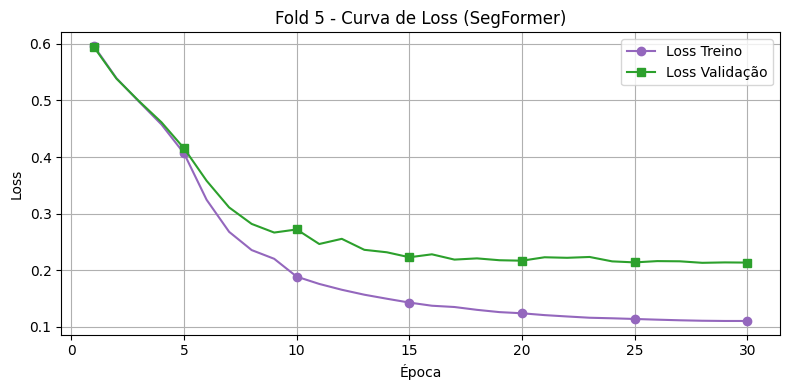

In [ ]:
# Gráficos de dice e loss
for fold, hist in enumerate(histories):
    epochs = np.arange(1, len(hist['loss']) + 1)
    mark_epochs = np.array([1] + list(range(5, len(hist['loss']) + 1, 5)))

    # Dice
    plt.figure(figsize=(8, 4))
    plt.plot(epochs, hist['dice_coef'], label='Dice Treino', color='tab:purple', marker='o', markevery=mark_epochs - 1)
    plt.plot(epochs, hist['val_dice_coef'], label='Dice Validação', color='tab:green', marker='s', markevery=mark_epochs - 1)
    plt.title(f'Fold {fold+1} - Curva de Dice (SegFormer)')
    plt.xlabel('Época')
    plt.ylabel('Dice')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Loss
    plt.figure(figsize=(8, 4))
    plt.plot(epochs, hist['loss'], label='Loss Treino', color='tab:purple', marker='o', markevery=mark_epochs - 1)
    plt.plot(epochs, hist['val_loss'], label='Loss Validação', color='tab:green', marker='s', markevery=mark_epochs - 1)
    plt.title(f'Fold {fold+1} - Curva de Loss (SegFormer)')
    plt.xlabel('Época')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

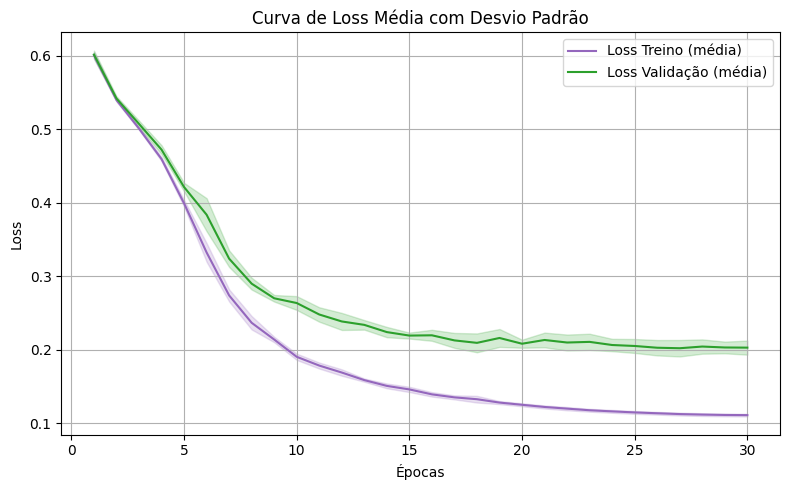

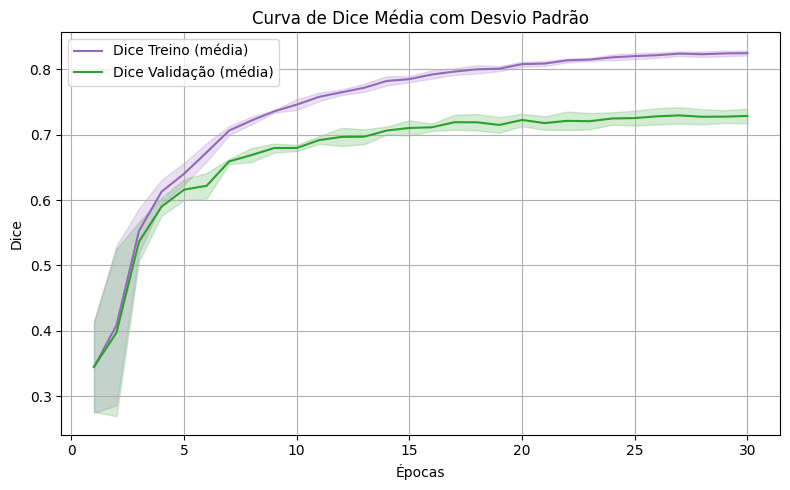

In [ ]:
# Gráficos dice e loss com desvio padrão
# Define o número máximo de épocas comuns entre os folds (para alinhar as curvas)
max_epochs = min(len(h['loss']) for h in histories)

# Extrai e corta os dados até o número de épocas mínimas
loss_train = np.array([h['loss'][:max_epochs] for h in histories])
loss_val = np.array([h['val_loss'][:max_epochs] for h in histories])
dice_train = np.array([h['dice_coef'][:max_epochs] for h in histories])
dice_val = np.array([h['val_dice_coef'][:max_epochs] for h in histories])

# Vetor de épocas
epochs = np.arange(1, max_epochs + 1)

# Curva de Loss com desvio padrão
plt.figure(figsize=(8, 5))
plt.plot(epochs, loss_train.mean(axis=0), label='Loss Treino (média)', color='tab:purple')
plt.fill_between(epochs,
                 loss_train.mean(axis=0) - loss_train.std(axis=0),
                 loss_train.mean(axis=0) + loss_train.std(axis=0),
                 alpha=0.2, color='tab:purple')

plt.plot(epochs, loss_val.mean(axis=0), label='Loss Validação (média)', color='tab:green')
plt.fill_between(epochs,
                 loss_val.mean(axis=0) - loss_val.std(axis=0),
                 loss_val.mean(axis=0) + loss_val.std(axis=0),
                 alpha=0.2, color='tab:green')

plt.title("Curva de Loss Média com Desvio Padrão")
plt.xlabel("Épocas")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Curva de Dice com desvio padrão
plt.figure(figsize=(8, 5))
plt.plot(epochs, dice_train.mean(axis=0), label='Dice Treino (média)', color='tab:purple')
plt.fill_between(epochs,
                 dice_train.mean(axis=0) - dice_train.std(axis=0),
                 dice_train.mean(axis=0) + dice_train.std(axis=0),
                 alpha=0.2, color='tab:purple')

plt.plot(epochs, dice_val.mean(axis=0), label='Dice Validação (média)', color='tab:green')
plt.fill_between(epochs,
                 dice_val.mean(axis=0) - dice_val.std(axis=0),
                 dice_val.mean(axis=0) + dice_val.std(axis=0),
                 alpha=0.2, color='tab:green')

plt.title("Curva de Dice Média com Desvio Padrão")
plt.xlabel("Épocas")
plt.ylabel("Dice")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# **Teste final**

In [ ]:
# Avaliação no conjunto final de teste
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Prepara datasets
train_dataset = BrainSegDataset(X_trainval, Y_trainval, SegformerFeatureExtractor(do_resize=True, size=512, do_normalize=True))

# Usa só 5% do treino como "dummy validation"
eval_subset = Subset(train_dataset, indices=np.random.choice(len(train_dataset), size=int(0.05 * len(train_dataset)), replace=False))

# Modelo
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=2,
    ignore_mismatched_sizes=True,
    id2label={0: "background", 1: "lesion"},
    label2id={"background": 0, "lesion": 1}
).to(device)

# Treinamento final
final_model_dir = "/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/segformer_final_model"
training_args = TrainingArguments(
        output_dir=final_model_dir,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=8,
        num_train_epochs=30,
        save_strategy="epoch",
        eval_strategy="epoch",
        logging_strategy="epoch",
        logging_dir=f"{final_model_dir}/logs",
        report_to="none"
    )

dice_callback = DiceScoreCallback()

trainer = CustomTrainerWithDice(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_subset,
    callbacks=[dice_callback]
)

dice_callback.trainer = trainer

print("🚀 Treinando modelo final no conjunto de treino/validação...")
trainer.train()

# Salva o modelo
trainer.save_model(final_model_dir)
SegformerFeatureExtractor(do_resize=True, size=512, do_normalize=True).save_pretrained(final_model_dir)

# Avaliação no conjunto de teste
print("\n✅ Avaliando no conjunto de teste...")
model.eval()

feature_extractor = SegformerFeatureExtractor.from_pretrained(final_model_dir)

y_probs, y_preds = [], []

with torch.no_grad():
    for x, y in tqdm(zip(X_test, Y_test), total=len(X_test)):
        inputs = feature_extractor(images=x, return_tensors="pt").to(device)
        logits = model(**inputs).logits
        probs = torch.sigmoid(logits[:, 1:2])
        h, w = y.shape
        probs_resized = torch.nn.functional.interpolate(probs, size=(h, w), mode='bilinear', align_corners=False)
        probs_np = probs_resized.squeeze().cpu().numpy()
        preds_np = (probs_np > 0.6).astype(np.uint8)

        y_probs.append(probs_np)
        y_preds.append(preds_np)

# Avaliação
Y_test_np = np.array([np.array(y) for y in Y_test])
Y_pred_test = np.array(y_preds).astype(np.uint8)

metrics = safe_metrics(Y_test_np, Y_pred_test)
dice = metrics['dice']
iou = metrics['iou']
recall = metrics['recall']
precision = metrics['precision']
f1 = metrics['f1']

# Salva os arrays
out_path = "/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/final_test_outputs"
os.makedirs(out_path, exist_ok=True)
np.save(f"{out_path}/X_test.npy", np.array([np.array(x) for x in X_test]))
np.save(f"{out_path}/Y_test.npy", Y_test_np)
np.save(f"{out_path}/Y_pred_test.npy", Y_pred_test)
np.save(f"{out_path}/Y_probs_test.npy", np.array(y_probs))

print(f"\n📊 Teste Final — Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

/usr/local/lib/python3.11/dist-packages/transformers/models/segformer/feature_extraction_segformer.py:30: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([2, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


🚀 Treinando modelo final no conjunto de treino/validação...


Epoch,Training Loss,Validation Loss
1,0.682900,0.576926
2,0.549000,0.519815
3,0.500800,0.474388
4,0.446700,0.398621
5,0.373600,0.300013
6,0.302400,0.242434
7,0.254400,0.197131
8,0.227200,0.179083
9,0.207800,0.162098
10,0.189600,0.150777


Avaliando Dice: 100%|██████████| 2933/2933 [01:05<00:00, 44.65it/s]


Epoch 1 — Dice Treino: 0.4044 | Val: 0.3931 | Loss Treino: 0.5734 | Val: 0.5773


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.78it/s]


Epoch 2 — Dice Treino: 0.4818 | Val: 0.4463 | Loss Treino: 0.5163 | Val: 0.5202


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.69it/s]


Epoch 3 — Dice Treino: 0.5928 | Val: 0.5923 | Loss Treino: 0.4718 | Val: 0.4761


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.77it/s]


Epoch 4 — Dice Treino: 0.6423 | Val: 0.6490 | Loss Treino: 0.3951 | Val: 0.4010


Avaliando Dice: 100%|██████████| 2933/2933 [01:08<00:00, 43.00it/s]


Epoch 5 — Dice Treino: 0.6851 | Val: 0.7059 | Loss Treino: 0.3094 | Val: 0.3103


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.89it/s]


Epoch 6 — Dice Treino: 0.7044 | Val: 0.7192 | Loss Treino: 0.2569 | Val: 0.2549


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 44.06it/s]


Epoch 7 — Dice Treino: 0.7321 | Val: 0.7671 | Loss Treino: 0.2154 | Val: 0.2025


Avaliando Dice: 100%|██████████| 2933/2933 [01:08<00:00, 42.97it/s]


Epoch 8 — Dice Treino: 0.7435 | Val: 0.7755 | Loss Treino: 0.1972 | Val: 0.1843


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.85it/s]


Epoch 9 — Dice Treino: 0.7501 | Val: 0.7942 | Loss Treino: 0.1793 | Val: 0.1659


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 44.01it/s]


Epoch 10 — Dice Treino: 0.7628 | Val: 0.7979 | Loss Treino: 0.1662 | Val: 0.1577


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.76it/s]


Epoch 11 — Dice Treino: 0.7757 | Val: 0.8040 | Loss Treino: 0.1570 | Val: 0.1520


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 44.07it/s]


Epoch 12 — Dice Treino: 0.7791 | Val: 0.8127 | Loss Treino: 0.1473 | Val: 0.1368


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.18it/s]


Epoch 13 — Dice Treino: 0.7864 | Val: 0.8192 | Loss Treino: 0.1405 | Val: 0.1322


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.80it/s]


Epoch 14 — Dice Treino: 0.7952 | Val: 0.8235 | Loss Treino: 0.1384 | Val: 0.1310


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.88it/s]


Epoch 15 — Dice Treino: 0.7997 | Val: 0.8281 | Loss Treino: 0.1347 | Val: 0.1277


Avaliando Dice: 100%|██████████| 2933/2933 [01:08<00:00, 42.99it/s]


Epoch 16 — Dice Treino: 0.7995 | Val: 0.8305 | Loss Treino: 0.1298 | Val: 0.1288


Avaliando Dice: 100%|██████████| 2933/2933 [01:08<00:00, 43.00it/s]


Epoch 17 — Dice Treino: 0.8086 | Val: 0.8392 | Loss Treino: 0.1253 | Val: 0.1196


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.19it/s]


Epoch 18 — Dice Treino: 0.8085 | Val: 0.8435 | Loss Treino: 0.1225 | Val: 0.1159


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.97it/s]


Epoch 19 — Dice Treino: 0.8141 | Val: 0.8435 | Loss Treino: 0.1203 | Val: 0.1111


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.72it/s]


Epoch 20 — Dice Treino: 0.8177 | Val: 0.8502 | Loss Treino: 0.1174 | Val: 0.1097


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.74it/s]


Epoch 21 — Dice Treino: 0.8162 | Val: 0.8415 | Loss Treino: 0.1154 | Val: 0.1071


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.97it/s]


Epoch 22 — Dice Treino: 0.8205 | Val: 0.8479 | Loss Treino: 0.1139 | Val: 0.1069


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.99it/s]


Epoch 23 — Dice Treino: 0.8252 | Val: 0.8548 | Loss Treino: 0.1120 | Val: 0.1053


Avaliando Dice: 100%|██████████| 2933/2933 [01:06<00:00, 43.80it/s]


Epoch 24 — Dice Treino: 0.8237 | Val: 0.8507 | Loss Treino: 0.1106 | Val: 0.1037


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.72it/s]


Epoch 25 — Dice Treino: 0.8257 | Val: 0.8549 | Loss Treino: 0.1098 | Val: 0.1020


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.73it/s]


Epoch 26 — Dice Treino: 0.8300 | Val: 0.8547 | Loss Treino: 0.1083 | Val: 0.1010


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.57it/s]


Epoch 27 — Dice Treino: 0.8302 | Val: 0.8570 | Loss Treino: 0.1079 | Val: 0.1001


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.66it/s]


Epoch 28 — Dice Treino: 0.8312 | Val: 0.8591 | Loss Treino: 0.1073 | Val: 0.0999


Avaliando Dice: 100%|██████████| 2933/2933 [01:07<00:00, 43.77it/s]


Epoch 29 — Dice Treino: 0.8319 | Val: 0.8569 | Loss Treino: 0.1071 | Val: 0.0996


Avaliando Dice: 100%|██████████| 2933/2933 [01:08<00:00, 42.77it/s]


Epoch 30 — Dice Treino: 0.8330 | Val: 0.8585 | Loss Treino: 0.1063 | Val: 0.0989


/usr/local/lib/python3.11/dist-packages/transformers/models/segformer/feature_extraction_segformer.py:30: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(



✅ Avaliando no conjunto de teste...


100%|██████████| 734/734 [00:16<00:00, 44.90it/s]



📊 Teste Final — Dice: 0.8124, IoU: 0.6841, Recall: 0.7745, Precision: 0.8543, F1: 0.8124


In [ ]:
# Tabela resumo métricas
csv_path = "/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/metricas_por_fold.csv"
df_folds = pd.read_csv(csv_path)

dice = metrics['dice']
iou = metrics['iou']
recall = metrics['recall']
precision = metrics['precision']
f1 = metrics['f1']

# Cria DataFrame com as métricas do teste final já calculadas
df_test = pd.DataFrame([{
    'fold': 'Teste Final',
    'dice': dice,
    'iou': iou,
    'recall': recall,
    'precision': precision,
    'f1': f1
}])

# Calcula a média apenas dos folds
df_folds_only = df_folds[~df_folds['fold'].astype(str).str.lower().str.contains("teste")]
media_row = df_folds_only.mean(numeric_only=True)
media_row['fold'] = 'Média (Folds)'

# Junta tudo em um DataFrame final
df_final = pd.concat([df_folds_only, pd.DataFrame([media_row]), df_test], ignore_index=True)
print("🔍 Tabela Final com Folds, Média e Teste Final:")
display(df_final.round(4))

🔍 Tabela Final com Folds, Média e Teste Final:


<ipython-input-52-fffad3adb4bf>:24: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Média (Folds)' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  media_row['fold'] = 'Média (Folds)'


,fold,dice,iou,recall,precision,f1
0,1,0.8005,0.6674,0.7519,0.8560,0.8005
1,2,0.7702,0.6262,0.7195,0.8285,0.7702
2,3,0.7874,0.6493,0.7614,0.8152,0.7874
3,4,0.8022,0.6698,0.7671,0.8407,0.8022
4,5,0.7907,0.6538,0.7486,0.8378,0.7907
5,Média (Folds),0.7902,0.6533,0.7497,0.8356,0.7902
6,Teste Final,0.8124,0.6841,0.7745,0.8543,0.8124


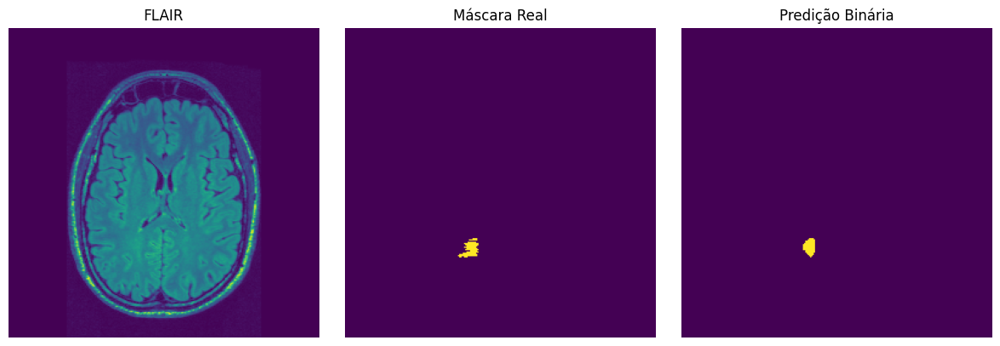

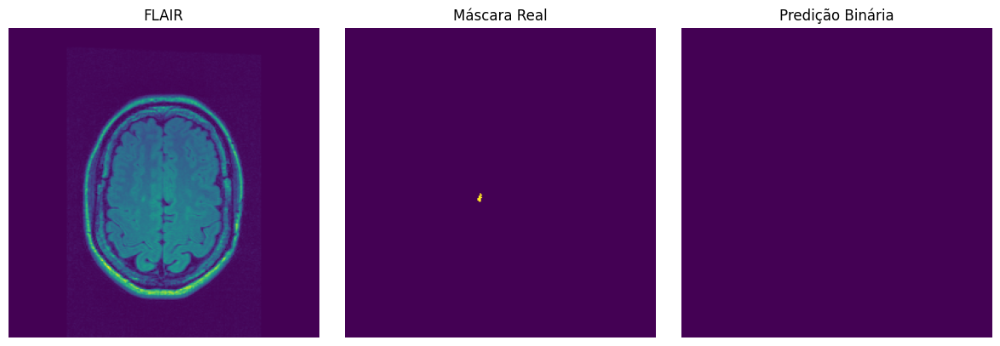

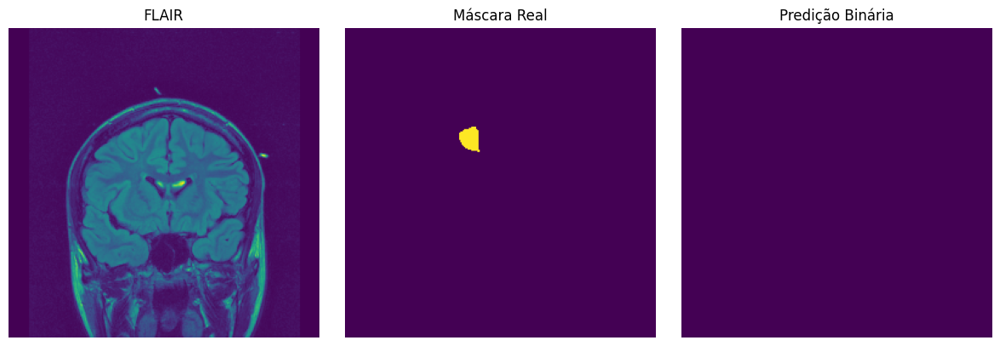

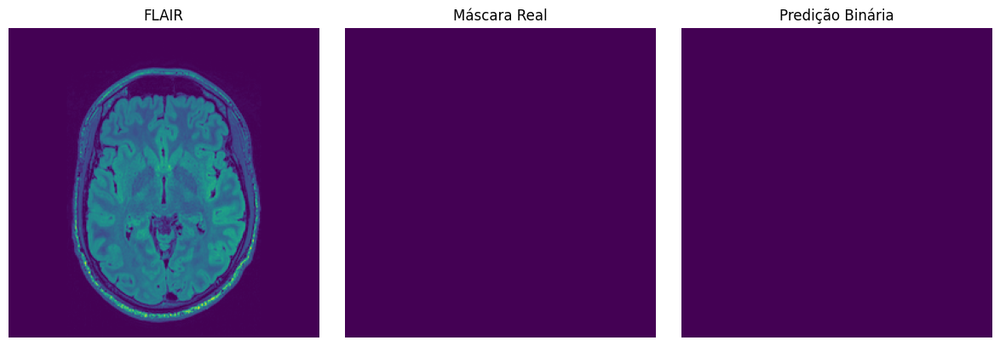

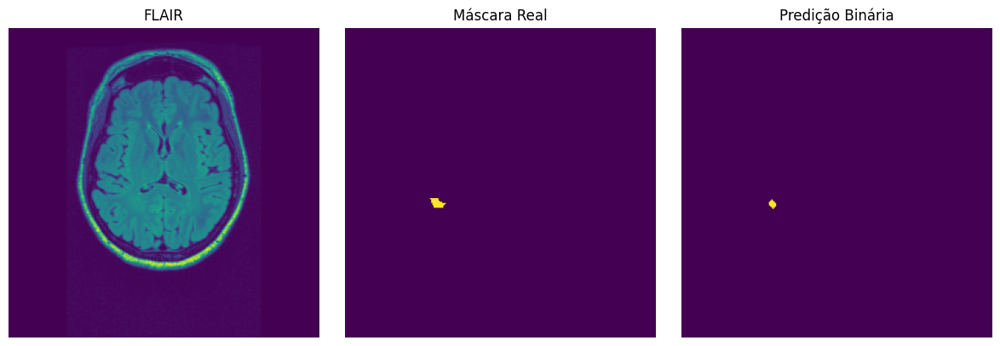

...

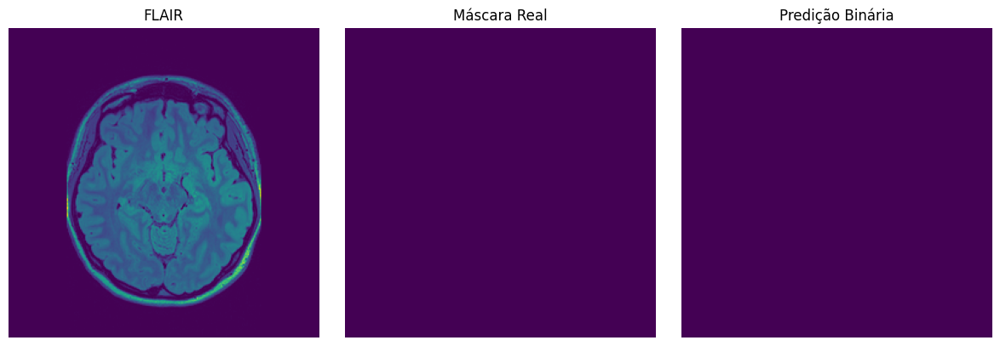

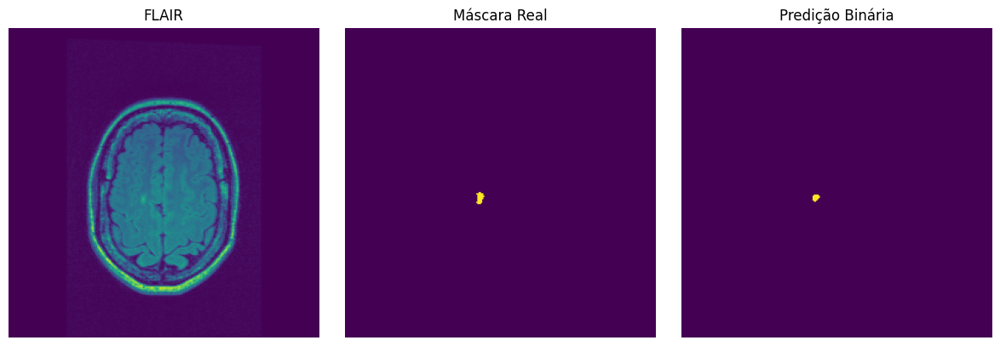

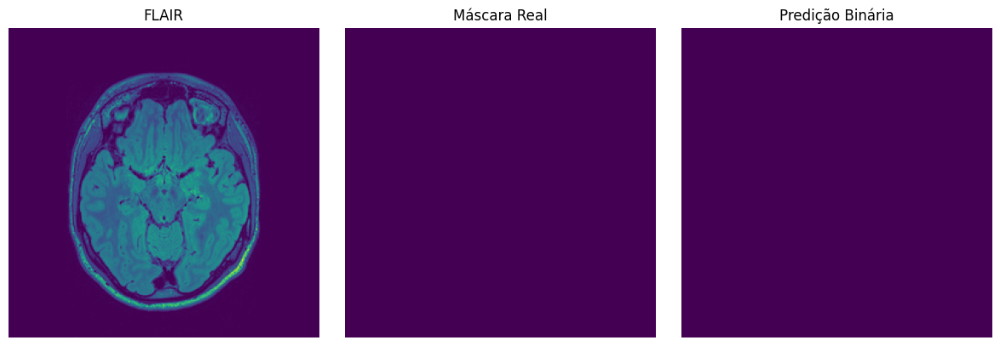

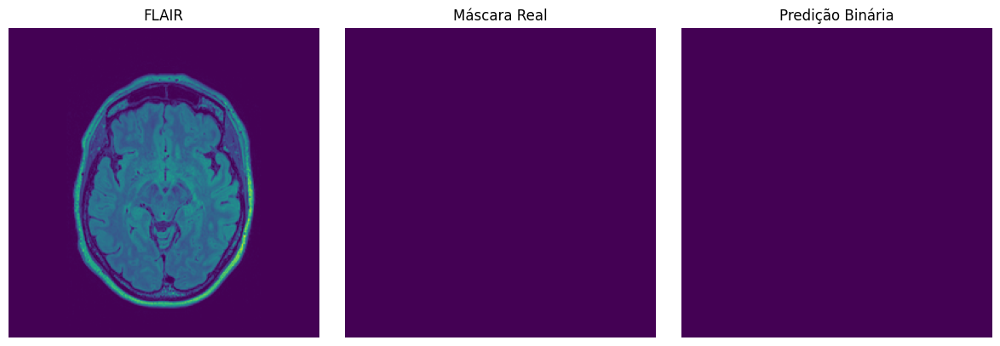

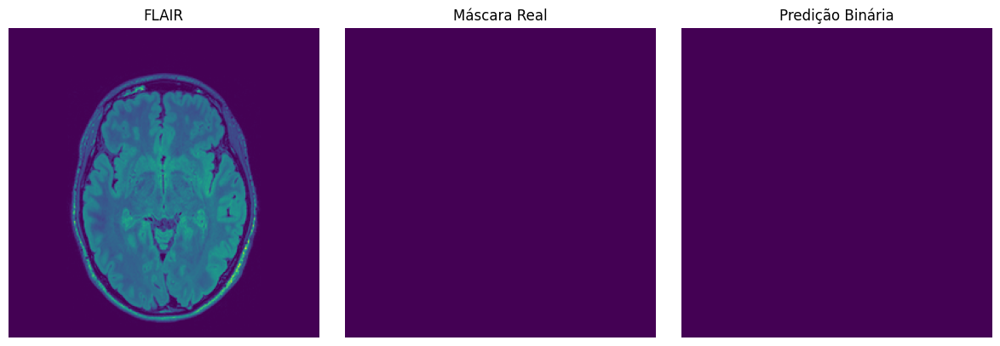

In [ ]:
# Visualização de 20 slices de teste
Y_probs_test = np.load("/content/drive/MyDrive/TCC/ResultadosSegFormerFinal/final_test_outputs/Y_probs_test.npy")

# Garante que Y_probs_test e X_test estão no formato certo
Y_pred_bin_test = (Y_probs_test > 0.6).astype(np.uint8)

# Visualiza as 20 primeiras amostras do teste
for i in range(20):
    plt.figure(figsize=(12, 4))

    # FLAIR
    plt.subplot(1, 3, 1)
    plt.title("FLAIR")
    flair_img = X_test[i]
    if flair_img.ndim == 3:
        flair_img = flair_img[..., 0]  # Pega um canal se estiver RGB
    plt.imshow(flair_img, cmap='viridis')
    plt.axis('off')

    # Máscara real
    plt.subplot(1, 3, 2)
    plt.title("Máscara Real")
    plt.imshow(Y_test[i].squeeze(), cmap='viridis')
    plt.axis('off')

    # Predição binária
    plt.subplot(1, 3, 3)
    plt.title("Predição Binária")
    plt.imshow(Y_pred_bin_test[i].squeeze(), cmap='viridis')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

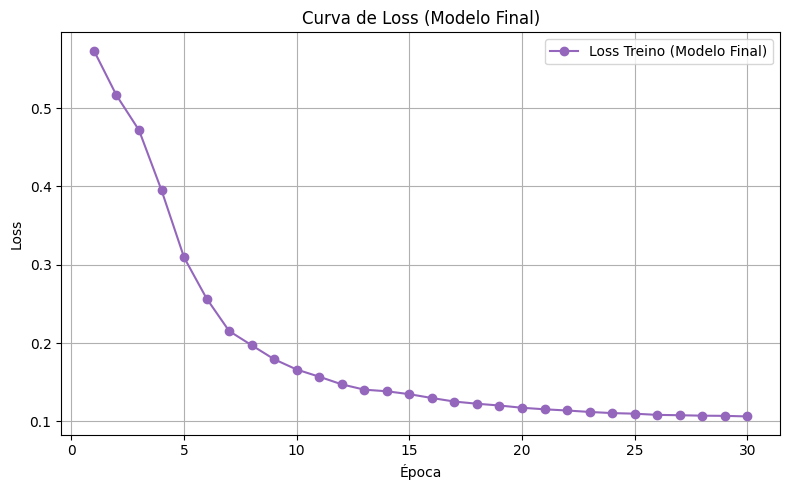

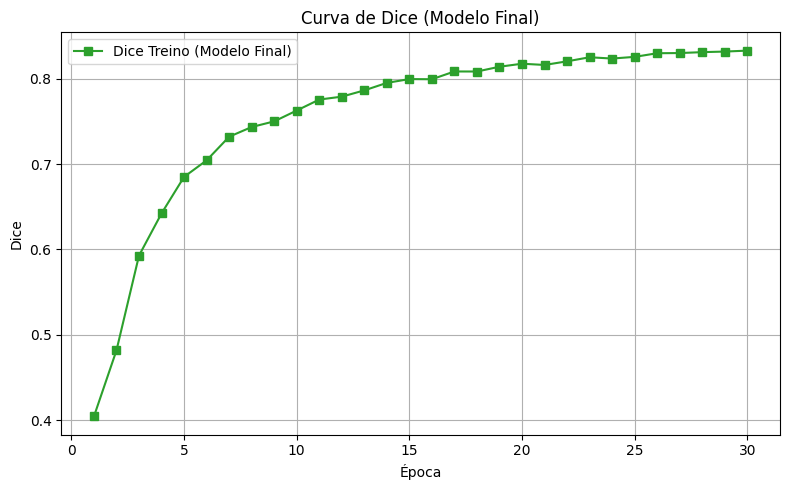

In [ ]:
# Gráficos dice e loss
epochs = np.arange(1, len(dice_callback.loss_train) + 1)
loss_train = dice_callback.loss_train
dice_train = dice_callback.dice_train

# Loss
plt.figure(figsize=(8, 5))
plt.plot(epochs, loss_train, label='Loss Treino (Modelo Final)', color='tab:purple', marker='o')
plt.title('Curva de Loss (Modelo Final)')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Dice
plt.figure(figsize=(8, 5))
plt.plot(epochs, dice_train, label='Dice Treino (Modelo Final)', color='tab:green', marker='s')
plt.title('Curva de Dice (Modelo Final)')
plt.xlabel('Época')
plt.ylabel('Dice')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


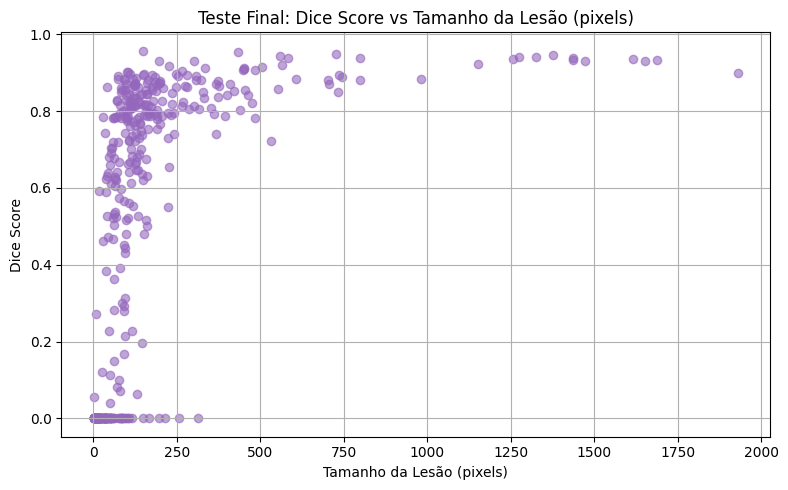

In [ ]:
# Plot Scatter
def dice_score(y_true, y_pred, smooth=1e-6):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

# Cálculo do Dice por slice e tamanho da lesão
lesion_pixels_per_slice_test = [np.sum(y.squeeze()) for y in Y_test_np]
dice_per_slice_test = [
    dice_score(y.squeeze(), y_hat.squeeze())
    for y, y_hat in zip(Y_test_np, Y_pred_test)
]

# Remove slices sem lesão para o gráfico
valid_indices = np.array(lesion_pixels_per_slice_test) > 0
x_vals = np.array(lesion_pixels_per_slice_test)[valid_indices]
y_vals = np.array(dice_per_slice_test)[valid_indices]

# Scatter Plot
plt.figure(figsize=(8,5))
plt.scatter(x_vals, y_vals, alpha=0.6, color='tab:purple')
plt.title("Teste Final: Dice Score vs Tamanho da Lesão (pixels)")
plt.xlabel("Tamanho da Lesão (pixels)")
plt.ylabel("Dice Score")
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-58-b3efc5477b63>:17: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


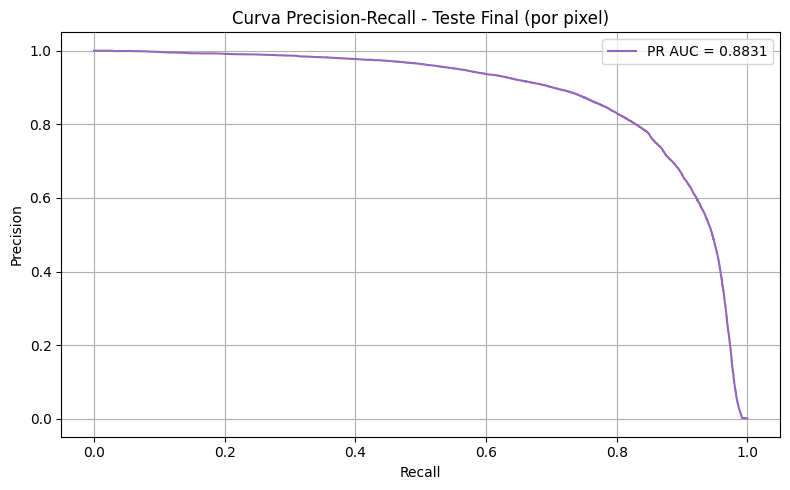

AUC PR (teste final): 0.8831


In [ ]:
# Curva Precision-Recall
all_y_true = Y_test_np.flatten()
all_y_probs = Y_probs_test.flatten()

# Calcula curva PR e área
precision, recall, thresholds_pr = precision_recall_curve(all_y_true, all_y_probs)
pr_auc = auc(recall, precision)

# Plot PR
plt.figure(figsize=(8, 5))
plt.plot(recall, precision, label=f'PR AUC = {pr_auc:.4f}', color='tab:purple')
plt.title('Curva Precision-Recall - Teste Final (por pixel)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Resultado
print(f"AUC PR (teste final): {pr_auc:.4f}")

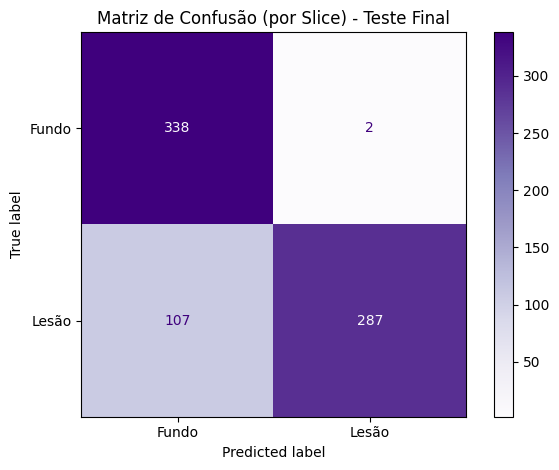

In [ ]:
# Matriz de confusão (por slice)
threshold = 0.6

# Slice-wise: presença ou ausência de lesão
y_true_slice = []
y_pred_slice = []

for i in range(len(Y_test_np)):
    mask_true = Y_test_np[i].squeeze()
    mask_pred = (Y_probs_test[i].squeeze() > threshold).astype(np.uint8)

    has_lesion_gt = int(np.sum(mask_true) > 0)
    has_lesion_pred = int(np.sum(mask_pred) > 0)

    y_true_slice.append(has_lesion_gt)
    y_pred_slice.append(has_lesion_pred)

# Matriz de Confusão por Slice
cm_slice = confusion_matrix(y_true_slice, y_pred_slice, labels=[0, 1])
disp = ConfusionMatrixDisplay(confusion_matrix=cm_slice, display_labels=["Fundo", "Lesão"])
disp.plot(cmap='Purples', values_format='d')
plt.title("Matriz de Confusão (por Slice) - Teste Final")
plt.grid(False)
plt.tight_layout()
plt.show()

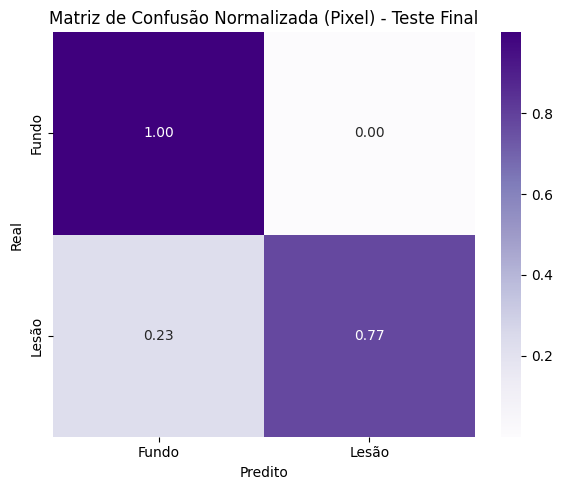

In [ ]:
# Matriz de confusão normalizada
all_y_true = Y_test_np.flatten()
all_y_pred_bin = (Y_probs_test.flatten() > 0.6).astype(np.uint8)

# Matriz de confusão por pixel
cm_pixel = confusion_matrix(all_y_true, all_y_pred_bin, labels=[0, 1])
cm_norm = cm_pixel.astype('float') / cm_pixel.sum(axis=1, keepdims=True)

# Plot usando seaborn
plt.figure(figsize=(6, 5))
sns.heatmap(cm_norm, annot=True, cmap='Purples', fmt='.2f',
            xticklabels=['Fundo', 'Lesão'], yticklabels=['Fundo', 'Lesão'])

plt.title("Matriz de Confusão Normalizada (Pixel) - Teste Final")
plt.xlabel("Predito")
plt.ylabel("Real")
plt.tight_layout()
plt.show()

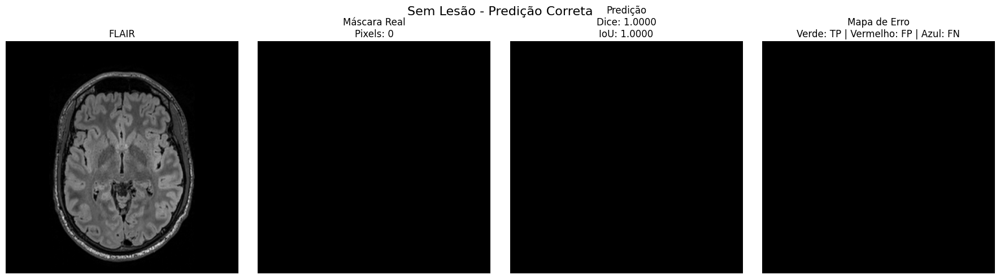

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


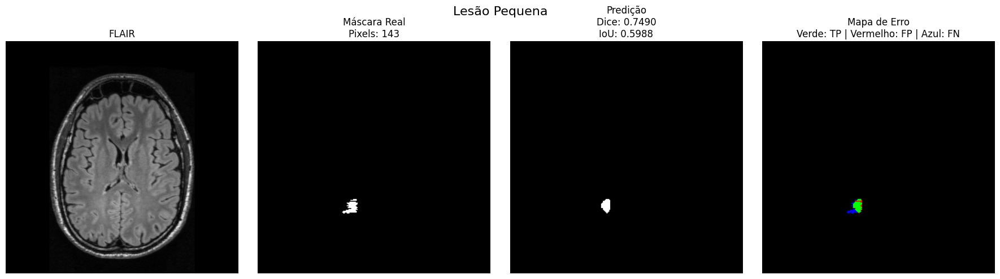

Dice: 0.7490, IoU: 0.5988, Recall: 0.6783, Precision: 0.8362, F1: 0.7490


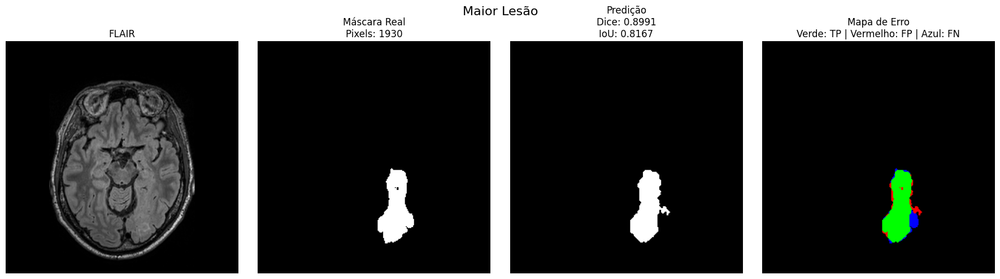

Dice: 0.8991, IoU: 0.8167, Recall: 0.8886, Precision: 0.9098, F1: 0.8991


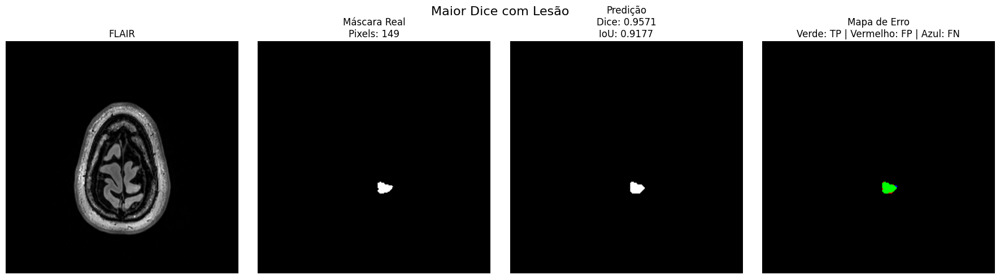

Dice: 0.9571, IoU: 0.9177, Recall: 0.9732, Precision: 0.9416, F1: 0.9571


In [ ]:
# Plot case qualitativo com mapa de erro
def plot_case_qualitativo_teste(idx, title_extra=''):
    mask_true = Y_test[idx].squeeze()
    flair = X_test[idx].squeeze()
    pred_probs = Y_probs_test[idx].squeeze()
    pred_bin = (pred_probs > 0.6).astype(np.uint8)

    # Métricas
    cm, dice, iou, recall, precision, f1 = calculate_all_metrics(mask_true, pred_bin)

    # Mapa de erro
    intersection = np.logical_and(mask_true == 1, pred_bin == 1)
    false_positive = np.logical_and(mask_true == 0, pred_bin == 1)
    false_negative = np.logical_and(mask_true == 1, pred_bin == 0)
    error_map = np.zeros((*mask_true.shape, 3), dtype=np.uint8)
    error_map[intersection] = [0, 255, 0]    # TP - Verde
    error_map[false_positive] = [255, 0, 0]  # FP - Vermelho
    error_map[false_negative] = [0, 0, 255]  # FN - Azul

    # Plots
    plt.figure(figsize=(18, 5))
    plt.subplot(1, 4, 1)
    plt.title("FLAIR")
    plt.imshow(flair, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Máscara Real\nPixels: {np.sum(mask_true)}")
    plt.imshow(mask_true, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}\nIoU: {iou:.4f}")
    plt.imshow(pred_bin, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Mapa de Erro\nVerde: TP | Vermelho: FP | Azul: FN")
    plt.imshow(error_map)
    plt.axis('off')

    plt.suptitle(title_extra, fontsize=16)
    plt.tight_layout()
    plt.show()

    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Seleção de casos interessantes
lesion_pixels_test = np.array([np.sum(mask.squeeze()) for mask in Y_test])
dice_per_slice_test = np.array([
    dice_score(y.squeeze(), (yp.squeeze() > 0.6).astype(np.uint8))
    for y, yp in zip(Y_test, Y_probs_test)
])

# Caso sem lesão e sem predição
no_lesion_cases = np.where(lesion_pixels_test == 0)[0]
valid_no_lesion = [i for i in no_lesion_cases if np.sum((Y_probs_test[i].squeeze() > 0.6)) == 0]
if valid_no_lesion:
    plot_case_qualitativo_teste(valid_no_lesion[0], title_extra='Sem Lesão - Predição Correta')

# Lesão pequena (exemplo: entre 100 e 400 pixels)
lesion_small_cases = np.where((lesion_pixels_test > 100) & (lesion_pixels_test < 400))[0]
if len(lesion_small_cases) > 0:
    plot_case_qualitativo_teste(lesion_small_cases[0], title_extra='Lesão Pequena')

# Caso com maior lesão
idx_max_lesion = np.argmax(lesion_pixels_test)
plot_case_qualitativo_teste(idx_max_lesion, title_extra='Maior Lesão')

# Caso com maior Dice entre os que têm lesão
cases_with_lesion = np.where(lesion_pixels_test > 0)[0]
idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice_test[cases_with_lesion])]
plot_case_qualitativo_teste(idx_best_dice, title_extra='Maior Dice com Lesão')


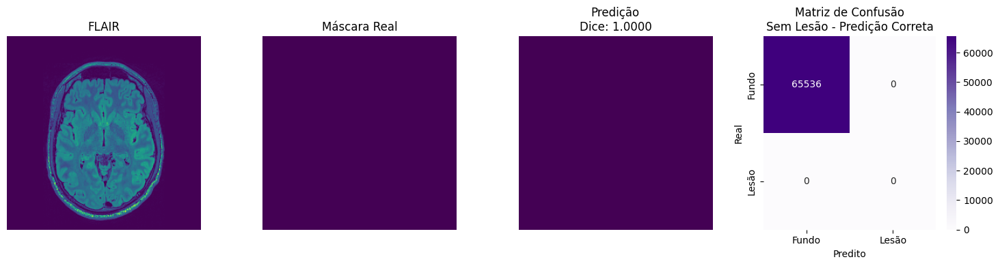

Dice: 1.0000, IoU: 1.0000, Recall: 1.0000, Precision: 1.0000, F1: 1.0000


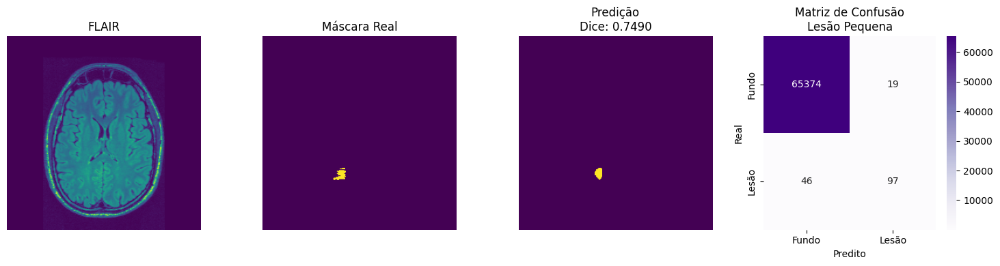

Dice: 0.7490, IoU: 0.5988, Recall: 0.6783, Precision: 0.8362, F1: 0.7490


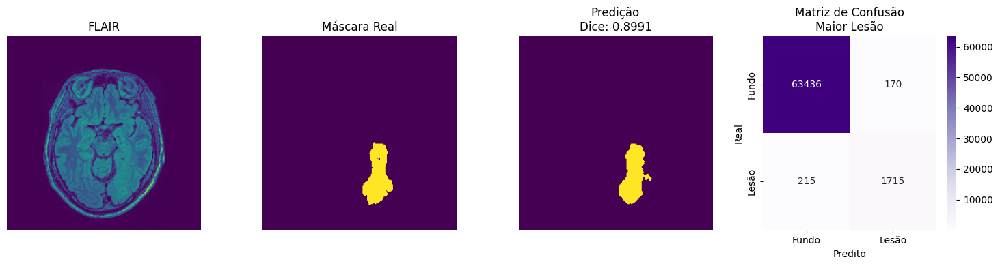

Dice: 0.8991, IoU: 0.8167, Recall: 0.8886, Precision: 0.9098, F1: 0.8991


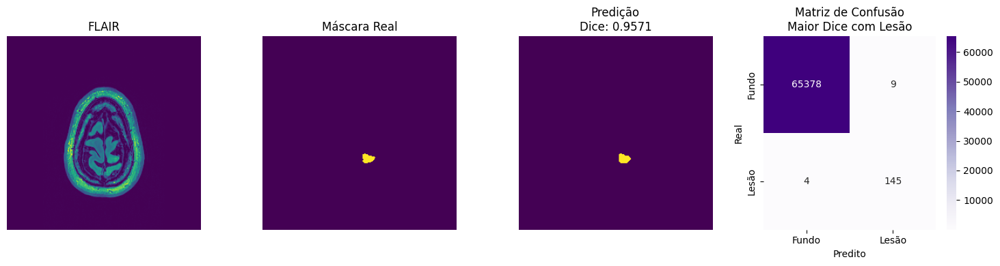

Dice: 0.9571, IoU: 0.9177, Recall: 0.9732, Precision: 0.9416, F1: 0.9571


In [ ]:
# Plot qualitativo com matriz de confusão
def plot_qualitativo_teste(idx, title_extra=''):
    mask_true = Y_test[idx].squeeze()
    flair = X_test[idx].squeeze()
    pred_probs = Y_probs_test[idx].squeeze()
    pred_bin = (pred_probs > 0.6).astype(np.uint8)

    # Métricas
    cm, dice, iou, recall, precision, f1 = calculate_all_metrics(mask_true, pred_bin)

    # Visualização
    plt.figure(figsize=(15, 4))

    # FLAIR
    plt.subplot(1, 4, 1)
    plt.title("FLAIR")
    if flair.ndim == 3:
        flair = flair[..., 0]  # Pega o primeiro canal se RGB
    plt.imshow(flair, cmap='viridis')
    plt.axis('off')

    # Máscara real
    plt.subplot(1, 4, 2)
    plt.title("Máscara Real")
    plt.imshow(mask_true, cmap='viridis')
    plt.axis('off')

    # Predição
    plt.subplot(1, 4, 3)
    plt.title(f"Predição\nDice: {dice:.4f}")
    plt.imshow(pred_bin, cmap='viridis')
    plt.axis('off')

    # Matriz de confusão
    plt.subplot(1, 4, 4)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
                xticklabels=['Fundo', 'Lesão'],
                yticklabels=['Fundo', 'Lesão'])
    plt.title(f"Matriz de Confusão\n{title_extra}")
    plt.xlabel("Predito")
    plt.ylabel("Real")

    plt.tight_layout()
    plt.show()

    # Imprime métricas numéricas
    print(f"Dice: {dice:.4f}, IoU: {iou:.4f}, Recall: {recall:.4f}, Precision: {precision:.4f}, F1: {f1:.4f}")

# Seleciona casos interessantes
lesion_pixels_test = np.array([np.sum(mask.squeeze()) for mask in Y_test])
dice_per_slice_test = np.array([
    dice_score(y.squeeze(), (yp.squeeze() > 0.6).astype(np.uint8))
    for y, yp in zip(Y_test, Y_probs_test)
])

# Caso sem lesão e sem predição
no_lesion_cases = np.where(lesion_pixels_test == 0)[0]
valid_no_lesion = [i for i in no_lesion_cases if np.sum((Y_probs_test[i].squeeze() > 0.6)) == 0]
if valid_no_lesion:
    plot_qualitativo_teste(valid_no_lesion[0], title_extra='Sem Lesão - Predição Correta')

# Caso com lesão pequena
lesion_small_cases = np.where((lesion_pixels_test > 100) & (lesion_pixels_test < 400))[0]
if len(lesion_small_cases) > 0:
    plot_qualitativo_teste(lesion_small_cases[0], title_extra='Lesão Pequena')

# Maior lesão
idx_max_lesion = np.argmax(lesion_pixels_test)
plot_qualitativo_teste(idx_max_lesion, title_extra='Maior Lesão')

# Maior Dice com lesão
cases_with_lesion = np.where(lesion_pixels_test > 0)[0]
idx_best_dice = cases_with_lesion[np.argmax(dice_per_slice_test[cases_with_lesion])]
plot_qualitativo_teste(idx_best_dice, title_extra='Maior Dice com Lesão')
